# Retina Blood Vessel Feature Analysis (EDA)

This notebook performs exploratory data analysis on the extracted vessel network features from the segmentation pipeline.

In [16]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
%matplotlib inline

# Configuration
FEATURES_DIR = 'Data/outputs/features'
pd.set_option('display.max_columns', None)

## EDA Functions

In [17]:
def load_feature_data(base_path: str):
    """
    Load all feature data for a given base filename.
    
    Args:
        base_path: Path without extension (e.g., 'Data/outputs/features/filename')
        
    Returns:
        tuple: (segments_df, nodes_df, network_image_path)
    """
    alldata_path = f"{base_path}_alldata.xlsx"
    degreedata_path = f"{base_path}_degreedata.xlsx"
    network_path = f"{base_path}_network.png"
    
    segments_df = pd.read_excel(alldata_path)
    nodes_df = pd.read_excel(degreedata_path)
    
    return segments_df, nodes_df, network_path


def get_filename_from_path(base_path: str) -> str:
    """Extract filename from base path."""
    return os.path.basename(base_path)

In [18]:
def display_network_image(network_path: str, title: str = None):
    """
    Display the network visualization image.
    
    Args:
        network_path: Path to the network PNG image
        title: Optional title for the image
    """
    fig, ax = plt.subplots(figsize=(10, 10))
    img = plt.imread(network_path)
    ax.imshow(img)
    ax.axis('off')
    if title:
        ax.set_title(title, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [19]:
def show_statistical_summary(segments_df: pd.DataFrame, nodes_df: pd.DataFrame):
    """
    Display statistical summary of vessel segment and node features.
    
    Args:
        segments_df: DataFrame containing vessel segment features
        nodes_df: DataFrame containing node features
    """
    numeric_cols = ['line', 'length', 'width', 'width_var', 'tortuosity']
    
    print("=" * 50)
    print("STATISTICAL SUMMARY")
    print("=" * 50)
    
    print(f"\nTotal vessel segments: {len(segments_df)}")
    print(f"Total network nodes: {len(nodes_df)}")
    
    print("\n--- Vessel Segment Statistics ---")
    display(segments_df[numeric_cols].describe())
    
    print("\n--- Network Node Statistics ---")
    display(nodes_df[['distance', 'degree']].describe())

In [20]:
def plot_morphology_distributions(segments_df: pd.DataFrame):
    """
    Plot distributions of vessel morphology features.
    
    Args:
        segments_df: DataFrame containing vessel segment features
    """
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Vessel length distribution
    axes[0, 0].hist(segments_df['length'], bins=30, edgecolor='black', alpha=0.7)
    axes[0, 0].set_xlabel('Length (pixels)')
    axes[0, 0].set_ylabel('Frequency')
    axes[0, 0].set_title('Vessel Length Distribution')
    axes[0, 0].axvline(segments_df['length'].mean(), color='red', linestyle='--', 
                       label=f"Mean: {segments_df['length'].mean():.2f}")
    axes[0, 0].legend()
    
    # Vessel width distribution
    axes[0, 1].hist(segments_df['width'], bins=20, edgecolor='black', alpha=0.7, color='green')
    axes[0, 1].set_xlabel('Width (pixels)')
    axes[0, 1].set_ylabel('Frequency')
    axes[0, 1].set_title('Vessel Width Distribution')
    axes[0, 1].axvline(segments_df['width'].mean(), color='red', linestyle='--', 
                       label=f"Mean: {segments_df['width'].mean():.2f}")
    axes[0, 1].legend()
    
    # Tortuosity distribution
    axes[0, 2].hist(segments_df['tortuosity'], bins=30, edgecolor='black', alpha=0.7, color='orange')
    axes[0, 2].set_xlabel('Tortuosity Index')
    axes[0, 2].set_ylabel('Frequency')
    axes[0, 2].set_title('Vessel Tortuosity Distribution')
    axes[0, 2].axvline(segments_df['tortuosity'].mean(), color='red', linestyle='--', 
                       label=f"Mean: {segments_df['tortuosity'].mean():.2f}")
    axes[0, 2].legend()
    
    # Line (straight-line distance) distribution
    axes[1, 0].hist(segments_df['line'], bins=30, edgecolor='black', alpha=0.7, color='purple')
    axes[1, 0].set_xlabel('Straight-line Distance (pixels)')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].set_title('Straight-line Distance Distribution')
    
    # Width variance distribution
    axes[1, 1].hist(segments_df['width_var'], bins=30, edgecolor='black', alpha=0.7, color='brown')
    axes[1, 1].set_xlabel('Width Variance')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].set_title('Width Variance Distribution')
    
    # Combined box plot
    axes[1, 2].boxplot([segments_df['length'], segments_df['width'], segments_df['tortuosity']], 
                       labels=['Length', 'Width', 'Tortuosity'])
    axes[1, 2].set_title('Feature Comparison (Box Plot)')
    axes[1, 2].set_ylabel('Value')
    
    plt.tight_layout()
    plt.show()

In [21]:
def plot_node_degree_analysis(nodes_df: pd.DataFrame):
    """
    Analyze and plot node degree distribution (branching patterns).
    
    Args:
        nodes_df: DataFrame containing node features
    """
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Degree distribution (bar chart)
    degree_counts = nodes_df['degree'].value_counts().sort_index()
    axes[0].bar(degree_counts.index, degree_counts.values, edgecolor='black', alpha=0.7)
    axes[0].set_xlabel('Node Degree')
    axes[0].set_ylabel('Count')
    axes[0].set_title('Node Degree Distribution')
    axes[0].set_xticks(degree_counts.index)
    
    # Add annotations
    for deg, count in degree_counts.items():
        axes[0].annotate(f'{count}', (deg, count), ha='center', va='bottom')
    
    # Degree interpretation pie chart
    degree_labels = {1: 'Endpoints', 2: 'Continuation', 3: 'Bifurcation', 4: 'Trifurcation'}
    labels = [degree_labels.get(d, f'Degree {d}') for d in degree_counts.index]
    axes[1].pie(degree_counts.values, labels=labels, autopct='%1.1f%%', startangle=90)
    axes[1].set_title('Node Type Distribution')
    
    # Distance from center distribution
    axes[2].hist(nodes_df['distance'], bins=30, edgecolor='black', alpha=0.7, color='teal')
    axes[2].set_xlabel('Distance from Center')
    axes[2].set_ylabel('Frequency')
    axes[2].set_title('Node Distance from Image Center')
    
    plt.tight_layout()
    plt.show()
    
    # Print branching statistics
    print("\n=== Branching Statistics ===")
    print(f"Total nodes: {len(nodes_df)}")
    print(f"Endpoints (degree=1): {(nodes_df['degree'] == 1).sum()} ({(nodes_df['degree'] == 1).mean()*100:.1f}%)")
    print(f"Continuation points (degree=2): {(nodes_df['degree'] == 2).sum()} ({(nodes_df['degree'] == 2).mean()*100:.1f}%)")
    print(f"Bifurcations (degree=3): {(nodes_df['degree'] == 3).sum()} ({(nodes_df['degree'] == 3).mean()*100:.1f}%)")
    print(f"Higher-order junctions (degree>=4): {(nodes_df['degree'] >= 4).sum()} ({(nodes_df['degree'] >= 4).mean()*100:.1f}%)")

In [22]:
def plot_feature_correlations(segments_df: pd.DataFrame):
    """
    Plot correlation matrix and scatter plots for vessel features.
    
    Args:
        segments_df: DataFrame containing vessel segment features
    """
    numeric_cols = ['line', 'length', 'width', 'width_var', 'tortuosity']
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Correlation heatmap
    corr_matrix = segments_df[numeric_cols].corr()
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
                fmt='.2f', ax=axes[0], square=True)
    axes[0].set_title('Feature Correlation Matrix')
    
    # Scatter plot: Length vs Tortuosity
    scatter = axes[1].scatter(segments_df['length'], segments_df['tortuosity'], 
                              c=segments_df['width'], cmap='viridis', alpha=0.6, s=30)
    axes[1].set_xlabel('Vessel Length')
    axes[1].set_ylabel('Tortuosity')
    axes[1].set_title('Length vs Tortuosity (colored by Width)')
    plt.colorbar(scatter, ax=axes[1], label='Width')
    
    plt.tight_layout()
    plt.show()
    
    print("\n=== Correlation Insights ===")
    print(f"Length-Tortuosity correlation: {corr_matrix.loc['length', 'tortuosity']:.3f}")
    print(f"Width-Width_var correlation: {corr_matrix.loc['width', 'width_var']:.3f}")
    print(f"Line-Length correlation: {corr_matrix.loc['line', 'length']:.3f}")

In [23]:
def analyze_tortuosity(segments_df: pd.DataFrame):
    """
    Detailed tortuosity analysis with categorization.
    
    Args:
        segments_df: DataFrame containing vessel segment features
    """
    # Categorize tortuosity
    def categorize_tortuosity(t):
        if t < 0.5:
            return 'Very Low (<0.5)'
        elif t < 0.8:
            return 'Low (0.5-0.8)'
        elif t < 1.0:
            return 'Moderate (0.8-1.0)'
        elif t < 1.2:
            return 'Normal (1.0-1.2)'
        else:
            return 'High (>1.2)'
    
    segments_df = segments_df.copy()
    segments_df['tortuosity_category'] = segments_df['tortuosity'].apply(categorize_tortuosity)
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Tortuosity categories pie chart
    tort_cats = segments_df['tortuosity_category'].value_counts()
    colors = ['#2ecc71', '#3498db', '#f39c12', '#e74c3c', '#9b59b6']
    axes[0].pie(tort_cats.values, labels=tort_cats.index, autopct='%1.1f%%', 
                colors=colors[:len(tort_cats)])
    axes[0].set_title('Tortuosity Category Distribution')
    
    # Tortuosity vs Width relationship
    category_order = ['Very Low (<0.5)', 'Low (0.5-0.8)', 'Moderate (0.8-1.0)', 
                      'Normal (1.0-1.2)', 'High (>1.2)']
    existing_cats = [c for c in category_order if c in segments_df['tortuosity_category'].values]
    sns.boxplot(data=segments_df, x='tortuosity_category', y='width', ax=axes[1], order=existing_cats)
    axes[1].set_xlabel('Tortuosity Category')
    axes[1].set_ylabel('Vessel Width')
    axes[1].set_title('Vessel Width by Tortuosity Category')
    axes[1].tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    print("\n=== Tortuosity Category Counts ===")
    print(segments_df['tortuosity_category'].value_counts())

In [24]:
def detect_and_plot_outliers(segments_df: pd.DataFrame):
    """
    Detect and visualize outliers using IQR method.
    
    Args:
        segments_df: DataFrame containing vessel segment features
    """
    def detect_outliers_iqr(df, column):
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        return outliers, lower_bound, upper_bound
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    for idx, col in enumerate(['length', 'width', 'tortuosity']):
        outliers, lb, ub = detect_outliers_iqr(segments_df, col)
        
        # Box plot with outliers highlighted
        bp = axes[idx].boxplot(segments_df[col], vert=True, patch_artist=True)
        bp['boxes'][0].set_facecolor('lightblue')
        
        # Add scatter of outliers
        if len(outliers) > 0:
            axes[idx].scatter([1] * len(outliers), outliers[col], c='red', alpha=0.5, 
                             label=f'Outliers: {len(outliers)}')
            axes[idx].legend()
        
        axes[idx].set_title(f'{col.capitalize()}\nOutliers: {len(outliers)} ({len(outliers)/len(segments_df)*100:.1f}%)')
        axes[idx].set_ylabel(col.capitalize())
    
    plt.tight_layout()
    plt.show()
    
    # Summary of outliers
    print("\n=== Outlier Summary ===")
    for col in ['length', 'width', 'tortuosity', 'width_var']:
        outliers, lb, ub = detect_outliers_iqr(segments_df, col)
        print(f"{col}: {len(outliers)} outliers ({len(outliers)/len(segments_df)*100:.1f}%) - Range: [{lb:.2f}, {ub:.2f}]")

In [25]:
def print_summary(segments_df: pd.DataFrame, nodes_df: pd.DataFrame, filename: str):
    """
    Print final summary statistics.
    
    Args:
        segments_df: DataFrame containing vessel segment features
        nodes_df: DataFrame containing node features
        filename: Name of the file being analyzed
    """
    # Categorize tortuosity for summary
    def categorize_tortuosity(t):
        if t < 0.5:
            return 'Very Low (<0.5)'
        elif t < 0.8:
            return 'Low (0.5-0.8)'
        elif t < 1.0:
            return 'Moderate (0.8-1.0)'
        elif t < 1.2:
            return 'Normal (1.0-1.2)'
        else:
            return 'High (>1.2)'
    
    tort_cats = segments_df['tortuosity'].apply(categorize_tortuosity)
    
    print("=" * 60)
    print(f"SUMMARY: {filename}")
    print("=" * 60)
    
    print("\n--- Dataset Overview ---")
    print(f"Total vessel segments: {len(segments_df)}")
    print(f"Total network nodes: {len(nodes_df)}")
    
    print("\n--- Vessel Morphology ---")
    print(f"Average vessel length: {segments_df['length'].mean():.2f} ± {segments_df['length'].std():.2f} pixels")
    print(f"Average vessel width: {segments_df['width'].mean():.2f} ± {segments_df['width'].std():.2f} pixels")
    print(f"Average tortuosity: {segments_df['tortuosity'].mean():.3f} ± {segments_df['tortuosity'].std():.3f}")
    
    print("\n--- Network Structure ---")
    print(f"Average node degree: {nodes_df['degree'].mean():.2f}")
    print(f"Bifurcation ratio: {(nodes_df['degree'] == 3).sum() / len(nodes_df) * 100:.1f}%")
    print(f"Endpoint ratio: {(nodes_df['degree'] == 1).sum() / len(nodes_df) * 100:.1f}%")
    
    print("\n--- Key Findings ---")
    print(f"1. Vessel length range: {segments_df['length'].min():.1f} - {segments_df['length'].max():.1f} pixels")
    print(f"2. Width range: {segments_df['width'].min():.1f} - {segments_df['width'].max():.1f} pixels")
    print(f"3. Most common tortuosity category: {tort_cats.mode()[0]}")
    print(f"4. Length-Tortuosity correlation: {segments_df['length'].corr(segments_df['tortuosity']):.3f}")
    print("=" * 60)

In [26]:
def run_full_eda(base_path: str):
    """
    Run complete EDA for a single feature file.
    
    Args:
        base_path: Path without extension (e.g., 'Data/outputs/features/filename')
    """
    filename = get_filename_from_path(base_path)
    
    print("=" * 70)
    print(f"EDA FOR: {filename}")
    print("=" * 70)
    
    # Load data
    segments_df, nodes_df, network_path = load_feature_data(base_path)
    
    # 1. Display network image first
    print("\n" + "=" * 50)
    print("1. NETWORK VISUALIZATION")
    print("=" * 50)
    display_network_image(network_path, f"Vessel Network: {filename}")
    
    # 2. Statistical summary
    print("\n" + "=" * 50)
    print("2. STATISTICAL SUMMARY")
    print("=" * 50)
    show_statistical_summary(segments_df, nodes_df)
    
    # 3. Morphology distributions
    print("\n" + "=" * 50)
    print("3. VESSEL MORPHOLOGY DISTRIBUTIONS")
    print("=" * 50)
    plot_morphology_distributions(segments_df)
    
    # 4. Node degree analysis
    print("\n" + "=" * 50)
    print("4. NODE DEGREE ANALYSIS (BRANCHING PATTERNS)")
    print("=" * 50)
    plot_node_degree_analysis(nodes_df)
    
    # 5. Feature correlations
    print("\n" + "=" * 50)
    print("5. FEATURE CORRELATIONS")
    print("=" * 50)
    plot_feature_correlations(segments_df)
    
    # 6. Tortuosity analysis
    print("\n" + "=" * 50)
    print("6. TORTUOSITY ANALYSIS")
    print("=" * 50)
    analyze_tortuosity(segments_df)
    
    # 7. Outlier detection
    print("\n" + "=" * 50)
    print("7. OUTLIER DETECTION")
    print("=" * 50)
    detect_and_plot_outliers(segments_df)
    
    # 8. Final summary
    print("\n" + "=" * 50)
    print("8. FINAL SUMMARY")
    print("=" * 50)
    print_summary(segments_df, nodes_df, filename)
    
    print("\n" + "=" * 70)
    print(f"EDA COMPLETE FOR: {filename}")
    print("=" * 70)

## Developmental Analysis Functions (P2-P7)

In [27]:
def extract_postnatal_day(filename: str) -> int:
    """
    Extract postnatal day (P2-P7) from filename.
    
    Args:
        filename: Filename like 'p4-from 5-5-2 M_patch_0'
        
    Returns:
        int: Postnatal day (2-7)
    """
    import re
    match = re.match(r'p(\d+)', filename.lower())
    if match:
        return int(match.group(1))
    return None


def load_all_data_by_day(file_paths: list) -> tuple:
    """
    Load all feature data and group by postnatal day.
    
    Args:
        file_paths: List of base paths to feature files
        
    Returns:
        tuple: (combined_segments_df, combined_nodes_df) with 'postnatal_day' column
    """
    all_segments = []
    all_nodes = []
    
    for path in file_paths:
        filename = get_filename_from_path(path)
        day = extract_postnatal_day(filename)
        
        if day is None:
            continue
            
        segments_df, nodes_df, _ = load_feature_data(path)
        segments_df['postnatal_day'] = f'P{day}'
        segments_df['filename'] = filename
        nodes_df['postnatal_day'] = f'P{day}'
        nodes_df['filename'] = filename
        
        all_segments.append(segments_df)
        all_nodes.append(nodes_df)
    
    combined_segments = pd.concat(all_segments, ignore_index=True)
    combined_nodes = pd.concat(all_nodes, ignore_index=True)
    
    return combined_segments, combined_nodes

In [28]:
def plot_developmental_morphology(segments_df: pd.DataFrame):
    """
    Plot vessel morphology changes across postnatal days P2-P7.
    
    Args:
        segments_df: Combined DataFrame with 'postnatal_day' column
    """
    day_order = ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']
    existing_days = [d for d in day_order if d in segments_df['postnatal_day'].values]
    
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    
    # 1. Vessel Length by Day
    sns.boxplot(data=segments_df, x='postnatal_day', y='length', order=existing_days, ax=axes[0, 0])
    axes[0, 0].set_xlabel('Postnatal Day')
    axes[0, 0].set_ylabel('Vessel Length (pixels)')
    axes[0, 0].set_title('Vessel Length Development')
    
    # 2. Vessel Width by Day
    sns.boxplot(data=segments_df, x='postnatal_day', y='width', order=existing_days, ax=axes[0, 1], color='green')
    axes[0, 1].set_xlabel('Postnatal Day')
    axes[0, 1].set_ylabel('Vessel Width (pixels)')
    axes[0, 1].set_title('Vessel Width Development')
    
    # 3. Tortuosity by Day
    sns.boxplot(data=segments_df, x='postnatal_day', y='tortuosity', order=existing_days, ax=axes[0, 2], color='orange')
    axes[0, 2].set_xlabel('Postnatal Day')
    axes[0, 2].set_ylabel('Tortuosity Index')
    axes[0, 2].set_title('Vessel Tortuosity Development')
    
    # 4. Mean Length Trend
    mean_length = segments_df.groupby('postnatal_day')['length'].mean().reindex(existing_days)
    std_length = segments_df.groupby('postnatal_day')['length'].std().reindex(existing_days)
    axes[1, 0].errorbar(existing_days, mean_length, yerr=std_length, marker='o', capsize=5, linewidth=2, markersize=8)
    axes[1, 0].set_xlabel('Postnatal Day')
    axes[1, 0].set_ylabel('Mean Length (pixels)')
    axes[1, 0].set_title('Mean Vessel Length Trend')
    axes[1, 0].grid(True, alpha=0.3)
    
    # 5. Mean Width Trend
    mean_width = segments_df.groupby('postnatal_day')['width'].mean().reindex(existing_days)
    std_width = segments_df.groupby('postnatal_day')['width'].std().reindex(existing_days)
    axes[1, 1].errorbar(existing_days, mean_width, yerr=std_width, marker='s', capsize=5, linewidth=2, markersize=8, color='green')
    axes[1, 1].set_xlabel('Postnatal Day')
    axes[1, 1].set_ylabel('Mean Width (pixels)')
    axes[1, 1].set_title('Mean Vessel Width Trend')
    axes[1, 1].grid(True, alpha=0.3)
    
    # 6. Mean Tortuosity Trend
    mean_tort = segments_df.groupby('postnatal_day')['tortuosity'].mean().reindex(existing_days)
    std_tort = segments_df.groupby('postnatal_day')['tortuosity'].std().reindex(existing_days)
    axes[1, 2].errorbar(existing_days, mean_tort, yerr=std_tort, marker='^', capsize=5, linewidth=2, markersize=8, color='orange')
    axes[1, 2].set_xlabel('Postnatal Day')
    axes[1, 2].set_ylabel('Mean Tortuosity')
    axes[1, 2].set_title('Mean Vessel Tortuosity Trend')
    axes[1, 2].grid(True, alpha=0.3)
    
    plt.suptitle('Vessel Morphology Development (P2-P7)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [29]:
def plot_developmental_branching(nodes_df: pd.DataFrame):
    """
    Plot branching pattern changes across postnatal days P2-P7.
    
    Args:
        nodes_df: Combined DataFrame with 'postnatal_day' column
    """
    day_order = ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']
    existing_days = [d for d in day_order if d in nodes_df['postnatal_day'].values]
    
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    
    # 1. Total Nodes by Day
    node_counts = nodes_df.groupby('postnatal_day').size().reindex(existing_days)
    axes[0, 0].bar(existing_days, node_counts.values, edgecolor='black', alpha=0.7)
    axes[0, 0].set_xlabel('Postnatal Day')
    axes[0, 0].set_ylabel('Total Nodes')
    axes[0, 0].set_title('Total Network Nodes')
    
    # 2. Mean Node Degree by Day
    sns.boxplot(data=nodes_df, x='postnatal_day', y='degree', order=existing_days, ax=axes[0, 1], color='coral')
    axes[0, 1].set_xlabel('Postnatal Day')
    axes[0, 1].set_ylabel('Node Degree')
    axes[0, 1].set_title('Node Degree Distribution')
    
    # 3. Distance from Center by Day
    sns.boxplot(data=nodes_df, x='postnatal_day', y='distance', order=existing_days, ax=axes[0, 2], color='teal')
    axes[0, 2].set_xlabel('Postnatal Day')
    axes[0, 2].set_ylabel('Distance from Center')
    axes[0, 2].set_title('Vessel Spread from Optic Nerve')
    
    # 4. Bifurcation Ratio by Day
    bifurc_ratio = nodes_df.groupby('postnatal_day').apply(
        lambda x: (x['degree'] == 3).sum() / len(x) * 100
    ).reindex(existing_days)
    axes[1, 0].plot(existing_days, bifurc_ratio.values, marker='o', linewidth=2, markersize=8, color='purple')
    axes[1, 0].set_xlabel('Postnatal Day')
    axes[1, 0].set_ylabel('Bifurcation Ratio (%)')
    axes[1, 0].set_title('Bifurcation Ratio Trend')
    axes[1, 0].grid(True, alpha=0.3)
    
    # 5. Endpoint Ratio by Day
    endpoint_ratio = nodes_df.groupby('postnatal_day').apply(
        lambda x: (x['degree'] == 1).sum() / len(x) * 100
    ).reindex(existing_days)
    axes[1, 1].plot(existing_days, endpoint_ratio.values, marker='s', linewidth=2, markersize=8, color='red')
    axes[1, 1].set_xlabel('Postnatal Day')
    axes[1, 1].set_ylabel('Endpoint Ratio (%)')
    axes[1, 1].set_title('Endpoint Ratio Trend (Vessel Tips)')
    axes[1, 1].grid(True, alpha=0.3)
    
    # 6. Mean Distance from Center Trend
    mean_dist = nodes_df.groupby('postnatal_day')['distance'].mean().reindex(existing_days)
    std_dist = nodes_df.groupby('postnatal_day')['distance'].std().reindex(existing_days)
    axes[1, 2].errorbar(existing_days, mean_dist, yerr=std_dist, marker='^', capsize=5, linewidth=2, markersize=8, color='teal')
    axes[1, 2].set_xlabel('Postnatal Day')
    axes[1, 2].set_ylabel('Mean Distance')
    axes[1, 2].set_title('Mean Vessel Spread Trend')
    axes[1, 2].grid(True, alpha=0.3)
    
    plt.suptitle('Vessel Network Branching Development (P2-P7)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [30]:
def plot_developmental_summary_table(segments_df: pd.DataFrame, nodes_df: pd.DataFrame):
    """
    Create summary statistics table for each postnatal day.
    
    Args:
        segments_df: Combined segments DataFrame with 'postnatal_day' column
        nodes_df: Combined nodes DataFrame with 'postnatal_day' column
    """
    day_order = ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']
    existing_days = [d for d in day_order if d in segments_df['postnatal_day'].values]
    
    summary_data = []
    
    for day in existing_days:
        seg_day = segments_df[segments_df['postnatal_day'] == day]
        node_day = nodes_df[nodes_df['postnatal_day'] == day]
        
        summary_data.append({
            'Postnatal Day': day,
            'Vessel Segments': len(seg_day),
            'Network Nodes': len(node_day),
            'Mean Length': f"{seg_day['length'].mean():.2f} ± {seg_day['length'].std():.2f}",
            'Mean Width': f"{seg_day['width'].mean():.2f} ± {seg_day['width'].std():.2f}",
            'Mean Tortuosity': f"{seg_day['tortuosity'].mean():.3f} ± {seg_day['tortuosity'].std():.3f}",
            'Bifurcation %': f"{(node_day['degree'] == 3).sum() / len(node_day) * 100:.1f}%",
            'Endpoint %': f"{(node_day['degree'] == 1).sum() / len(node_day) * 100:.1f}%",
            'Mean Distance': f"{node_day['distance'].mean():.1f}"
        })
    
    summary_df = pd.DataFrame(summary_data)
    display(summary_df)
    
    return summary_df

In [31]:
def plot_violin_comparison(segments_df: pd.DataFrame):
    """
    Plot violin plots for feature comparison across postnatal days.
    
    Args:
        segments_df: Combined DataFrame with 'postnatal_day' column
    """
    day_order = ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']
    existing_days = [d for d in day_order if d in segments_df['postnatal_day'].values]
    
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    
    # Length violin
    sns.violinplot(data=segments_df, x='postnatal_day', y='length', order=existing_days, ax=axes[0])
    axes[0].set_xlabel('Postnatal Day')
    axes[0].set_ylabel('Vessel Length')
    axes[0].set_title('Length Distribution by Day')
    
    # Width violin
    sns.violinplot(data=segments_df, x='postnatal_day', y='width', order=existing_days, ax=axes[1], color='green')
    axes[1].set_xlabel('Postnatal Day')
    axes[1].set_ylabel('Vessel Width')
    axes[1].set_title('Width Distribution by Day')
    
    # Tortuosity violin
    sns.violinplot(data=segments_df, x='postnatal_day', y='tortuosity', order=existing_days, ax=axes[2], color='orange')
    axes[2].set_xlabel('Postnatal Day')
    axes[2].set_ylabel('Tortuosity')
    axes[2].set_title('Tortuosity Distribution by Day')
    
    plt.suptitle('Feature Distribution Comparison (P2-P7)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [32]:
def run_developmental_analysis(file_paths: list):
    """
    Run complete developmental analysis comparing P2-P7.
    
    Args:
        file_paths: List of base paths to feature files
    """
    print("=" * 70)
    print("DEVELOPMENTAL ANALYSIS: MOUSE RETINAL VASCULATURE (P2-P7)")
    print("=" * 70)
    print("\nLoading all data...")
    
    # Load all data
    segments_df, nodes_df = load_all_data_by_day(file_paths)
    
    print(f"Total vessel segments loaded: {len(segments_df)}")
    print(f"Total network nodes loaded: {len(nodes_df)}")
    print(f"Postnatal days: {sorted(segments_df['postnatal_day'].unique())}")
    
    # 1. Summary Table
    print("\n" + "=" * 50)
    print("1. SUMMARY STATISTICS BY POSTNATAL DAY")
    print("=" * 50)
    summary_df = plot_developmental_summary_table(segments_df, nodes_df)
    
    # 2. Morphology Development
    print("\n" + "=" * 50)
    print("2. VESSEL MORPHOLOGY DEVELOPMENT")
    print("=" * 50)
    plot_developmental_morphology(segments_df)
    
    # 3. Branching Development
    print("\n" + "=" * 50)
    print("3. BRANCHING PATTERN DEVELOPMENT")
    print("=" * 50)
    plot_developmental_branching(nodes_df)
    
    # 4. Violin Comparison
    print("\n" + "=" * 50)
    print("4. FEATURE DISTRIBUTION COMPARISON")
    print("=" * 50)
    plot_violin_comparison(segments_df)
    
    # 5. Key Findings
    print("\n" + "=" * 50)
    print("5. KEY DEVELOPMENTAL FINDINGS")
    print("=" * 50)
    
    day_order = ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']
    existing_days = [d for d in day_order if d in segments_df['postnatal_day'].values]
    
    if len(existing_days) >= 2:
        first_day = existing_days[0]
        last_day = existing_days[-1]
        
        first_seg = segments_df[segments_df['postnatal_day'] == first_day]
        last_seg = segments_df[segments_df['postnatal_day'] == last_day]
        first_node = nodes_df[nodes_df['postnatal_day'] == first_day]
        last_node = nodes_df[nodes_df['postnatal_day'] == last_day]
        
        print(f"\n--- Changes from {first_day} to {last_day} ---")
        
        length_change = ((last_seg['length'].mean() - first_seg['length'].mean()) / first_seg['length'].mean()) * 100
        width_change = ((last_seg['width'].mean() - first_seg['width'].mean()) / first_seg['width'].mean()) * 100
        tort_change = ((last_seg['tortuosity'].mean() - first_seg['tortuosity'].mean()) / first_seg['tortuosity'].mean()) * 100
        dist_change = ((last_node['distance'].mean() - first_node['distance'].mean()) / first_node['distance'].mean()) * 100
        
        print(f"Mean vessel length: {'+' if length_change > 0 else ''}{length_change:.1f}%")
        print(f"Mean vessel width: {'+' if width_change > 0 else ''}{width_change:.1f}%")
        print(f"Mean tortuosity: {'+' if tort_change > 0 else ''}{tort_change:.1f}%")
        print(f"Mean distance from center: {'+' if dist_change > 0 else ''}{dist_change:.1f}%")
        
        first_bifurc = (first_node['degree'] == 3).sum() / len(first_node) * 100
        last_bifurc = (last_node['degree'] == 3).sum() / len(last_node) * 100
        print(f"Bifurcation ratio: {first_bifurc:.1f}% → {last_bifurc:.1f}%")
    
    print("\n" + "=" * 70)
    print("DEVELOPMENTAL ANALYSIS COMPLETE")
    print("=" * 70)
    
    return segments_df, nodes_df

## List Available Files

In [33]:
def list_available_files(features_dir: str = FEATURES_DIR):
    """
    List all available feature files in the directory.
    
    Args:
        features_dir: Path to features directory
        
    Returns:
        list: List of base paths (without extension)
    """
    alldata_files = glob.glob(os.path.join(features_dir, '*_alldata.xlsx'))
    base_paths = [f.replace('_alldata.xlsx', '') for f in alldata_files]
    
    print(f"Found {len(base_paths)} feature files:\n")
    for i, path in enumerate(sorted(base_paths)):
        print(f"{i+1}. {os.path.basename(path)}")
    
    return sorted(base_paths)

# List available files
available_files = list_available_files()

Found 63 feature files:

1. p2-from 5-5-2 M_patch_0
2. p2-from 5-5-2 M_patch_1
3. p2-from 5-5-2 M_patch_2
4. p2-from 5-5-2 M_patch_3
5. p2-from 5-5-2 M_patch_4
6. p2-from 5-5-2 M_patch_5
7. p2-from 5-5-2 M_patch_6
8. p2-from 5-5-2 M_patch_7
9. p2-from 5-5-2 M_patch_8
10. p3-from 5-5-2 M_patch_0
11. p3-from 5-5-2 M_patch_1
12. p3-from 5-5-2 M_patch_2
13. p3-from 5-5-2 M_patch_3
14. p3-from 5-5-2 M_patch_4
15. p3-from 5-5-2 M_patch_5
16. p3-from 5-5-2 M_patch_6
17. p3-from 5-5-2 M_patch_7
18. p3-from 5-5-2 M_patch_8
19. p4-from 5-5-2 M_patch_0
20. p4-from 5-5-2 M_patch_1
21. p4-from 5-5-2 M_patch_2
22. p4-from 5-5-2 M_patch_3
23. p4-from 5-5-2 M_patch_4
24. p4-from 5-5-2 M_patch_5
25. p4-from 5-5-2 M_patch_6
26. p4-from 5-5-2 M_patch_7
27. p4-from 5-5-2 M_patch_8
28. p5-from 5-5-1 M_patch_0
29. p5-from 5-5-1 M_patch_1
30. p5-from 5-5-1 M_patch_2
31. p5-from 5-5-1 M_patch_3
32. p5-from 5-5-1 M_patch_4
33. p5-from 5-5-1 M_patch_5
34. p5-from 5-5-1 M_patch_6
35. p5-from 5-5-1 M_patch_7
36. 

## Run EDA

Select a file from the list above and run EDA using one of these methods:

```python
# Option 1: Use index from the list
run_full_eda(available_files[0])

# Option 2: Use full path directly
run_full_eda('Data/outputs/features/p4-from 5-5-2 M_patch_0')

# Option 3: Run individual analysis functions
segments_df, nodes_df, network_path = load_feature_data(available_files[0])
display_network_image(network_path)
plot_morphology_distributions(segments_df)
plot_node_degree_analysis(nodes_df)
plot_feature_correlations(segments_df)
analyze_tortuosity(segments_df)
detect_and_plot_outliers(segments_df)
```

EDA FOR: p2-from 5-5-2 M_patch_4

1. NETWORK VISUALIZATION


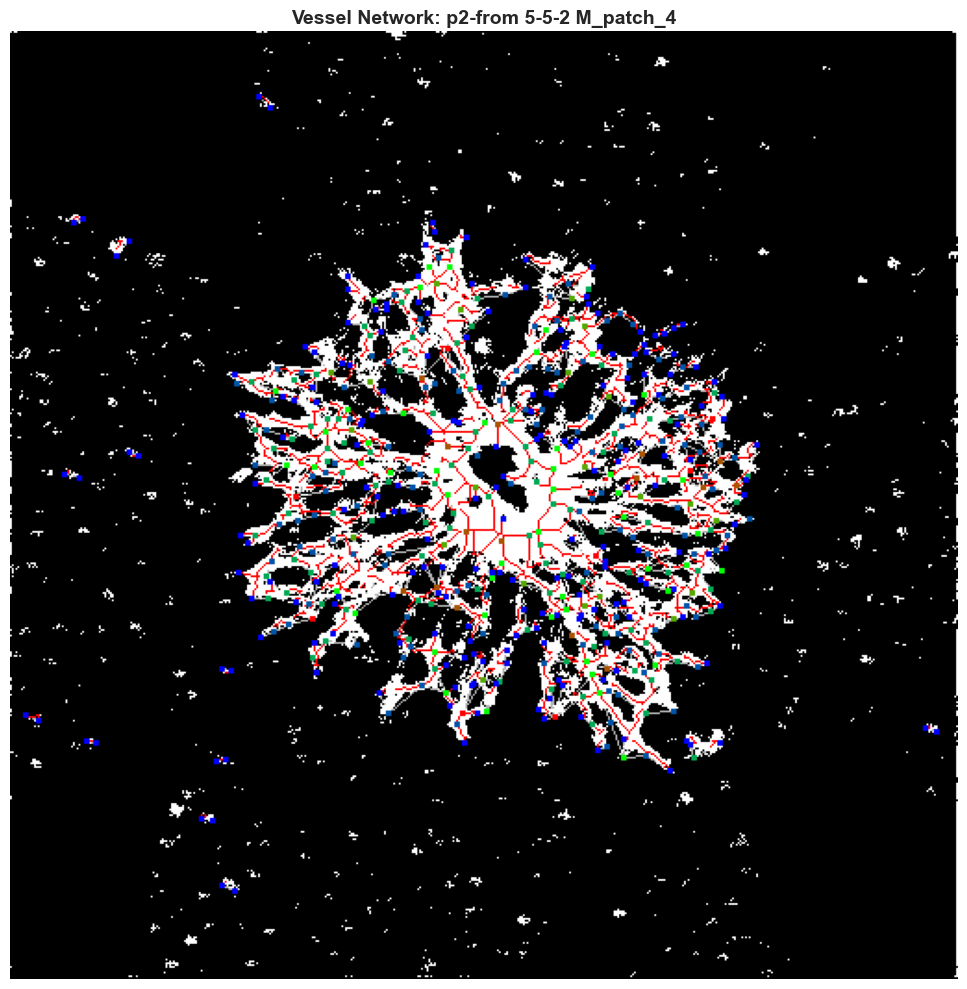


2. STATISTICAL SUMMARY
STATISTICAL SUMMARY

Total vessel segments: 635
Total network nodes: 545

--- Vessel Segment Statistics ---


,line,length,width,width_var,tortuosity
count,635.000000,635.000000,635.000000,635.000000,635.000000
mean,11.818269,8.613133,4.364567,1.889342,0.822503
std,5.427556,3.517454,3.135442,4.299011,0.364611
min,5.099020,3.000000,2.000000,0.000000,0.166306
25%,7.615773,6.000000,2.000000,0.000000,0.550062
50%,10.816654,8.242642,4.000000,0.816327,0.759740
75%,14.560220,10.242642,5.500000,2.000000,1.049490
max,35.510562,29.556354,25.000000,55.402344,2.170633



--- Network Node Statistics ---


,distance,degree
count,545.000000,545.000000
mean,100.345227,2.330275
std,44.160122,1.517393
min,4.242641,1.000000
25%,72.422372,1.000000
50%,100.129916,2.000000
75%,122.494898,3.000000
max,277.771489,9.000000



3. VESSEL MORPHOLOGY DISTRIBUTIONS


/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/1856382823.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1, 2].boxplot([segments_df['length'], segments_df['width'], segments_df['tortuosity']],


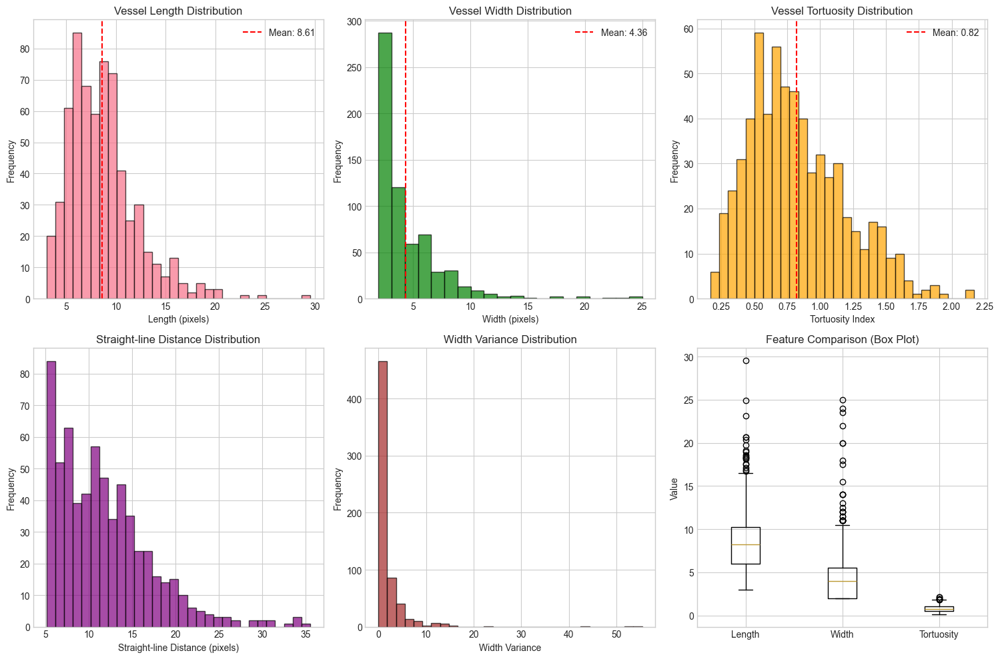


4. NODE DEGREE ANALYSIS (BRANCHING PATTERNS)


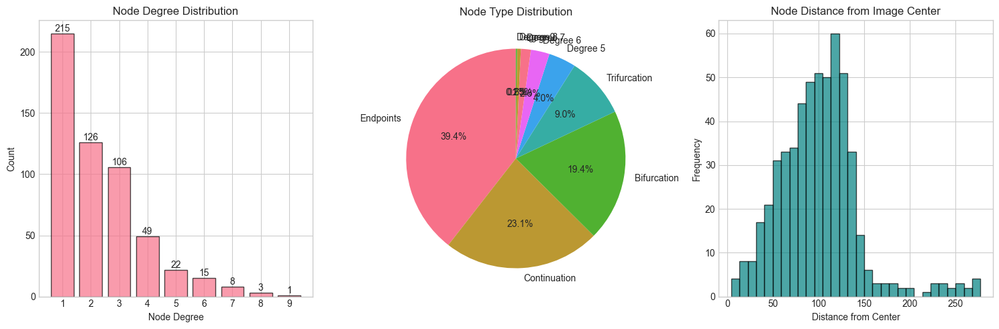


=== Branching Statistics ===
Total nodes: 545
Endpoints (degree=1): 215 (39.4%)
Continuation points (degree=2): 126 (23.1%)
Bifurcations (degree=3): 106 (19.4%)
Higher-order junctions (degree>=4): 98 (18.0%)

5. FEATURE CORRELATIONS


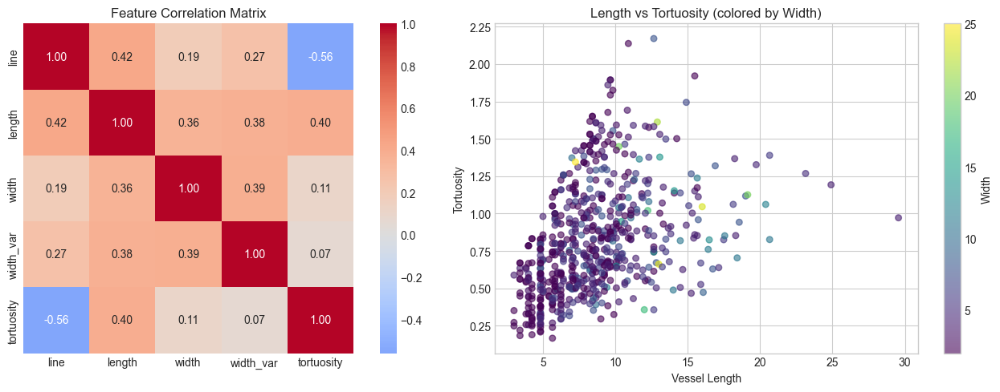


=== Correlation Insights ===
Length-Tortuosity correlation: 0.396
Width-Width_var correlation: 0.386
Line-Length correlation: 0.424

6. TORTUOSITY ANALYSIS


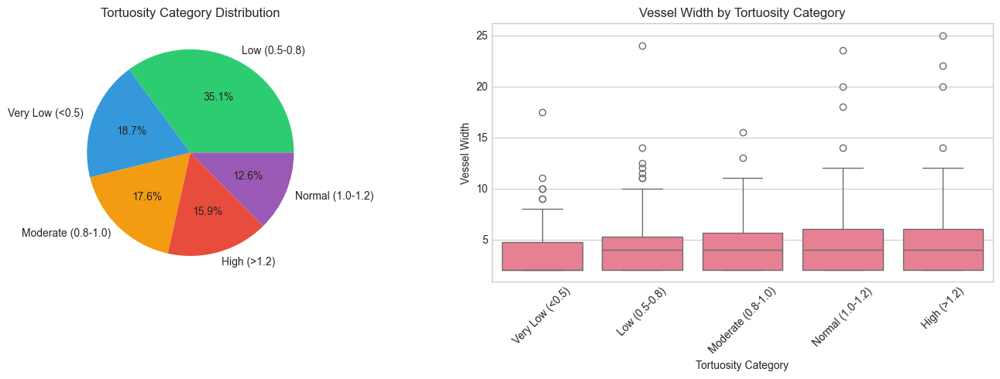


=== Tortuosity Category Counts ===
tortuosity_category
Low (0.5-0.8)         223
Very Low (<0.5)       119
Moderate (0.8-1.0)    112
High (>1.2)           101
Normal (1.0-1.2)       80
Name: count, dtype: int64

7. OUTLIER DETECTION


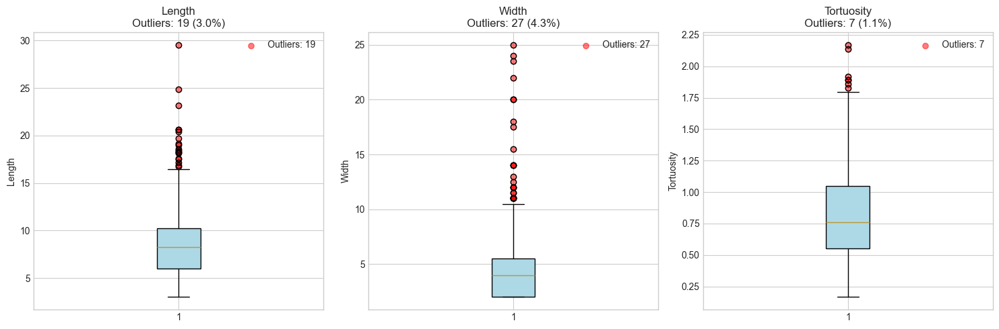


=== Outlier Summary ===
length: 19 outliers (3.0%) - Range: [-0.36, 16.61]
width: 27 outliers (4.3%) - Range: [-3.25, 10.75]
tortuosity: 7 outliers (1.1%) - Range: [-0.20, 1.80]
width_var: 59 outliers (9.3%) - Range: [-3.00, 5.00]

8. FINAL SUMMARY
SUMMARY: p2-from 5-5-2 M_patch_4

--- Dataset Overview ---
Total vessel segments: 635
Total network nodes: 545

--- Vessel Morphology ---
Average vessel length: 8.61 ± 3.52 pixels
Average vessel width: 4.36 ± 3.14 pixels
Average tortuosity: 0.823 ± 0.365

--- Network Structure ---
Average node degree: 2.33
Bifurcation ratio: 19.4%
Endpoint ratio: 39.4%

--- Key Findings ---
1. Vessel length range: 3.0 - 29.6 pixels
2. Width range: 2.0 - 25.0 pixels
3. Most common tortuosity category: Low (0.5-0.8)
4. Length-Tortuosity correlation: 0.396

EDA COMPLETE FOR: p2-from 5-5-2 M_patch_4


In [34]:
# Run EDA on a selected file (change index to analyze different files)
# Uncomment the line below and change the index to run EDA
run_full_eda(available_files[4])

EDA FOR: p3-from 5-5-2 M_patch_4

1. NETWORK VISUALIZATION


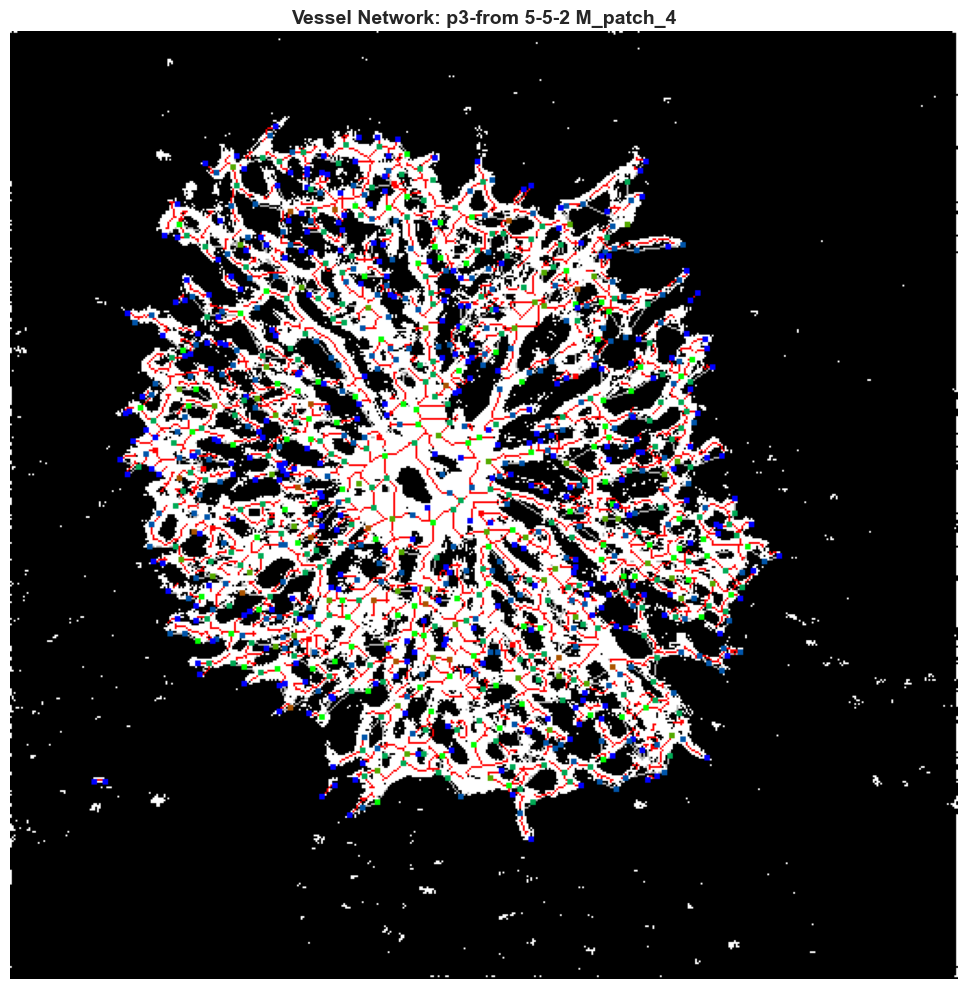


2. STATISTICAL SUMMARY
STATISTICAL SUMMARY

Total vessel segments: 1180
Total network nodes: 947

--- Vessel Segment Statistics ---


,line,length,width,width_var,tortuosity
count,1180.000000,1180.000000,1180.000000,1180.000000,1180.000000
mean,11.575532,8.736699,4.639407,1.872818,0.846456
std,5.067343,3.383764,2.879075,3.362065,0.361553
min,5.099020,3.000000,2.000000,0.000000,0.136459
25%,7.810250,6.242642,2.000000,0.187500,0.564528
50%,10.367968,8.242642,4.000000,0.888889,0.807436
75%,14.000000,10.414214,6.000000,2.187500,1.083046
max,35.057096,25.899498,23.000000,47.763314,2.585655



--- Network Node Statistics ---


,distance,degree
count,947.000000,947.000000
mean,120.223400,2.492080
std,43.351253,1.491587
min,5.000000,1.000000
25%,88.648120,1.000000
50%,124.020160,2.000000
75%,152.959144,3.000000
max,245.904453,9.000000



3. VESSEL MORPHOLOGY DISTRIBUTIONS


/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/1856382823.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1, 2].boxplot([segments_df['length'], segments_df['width'], segments_df['tortuosity']],


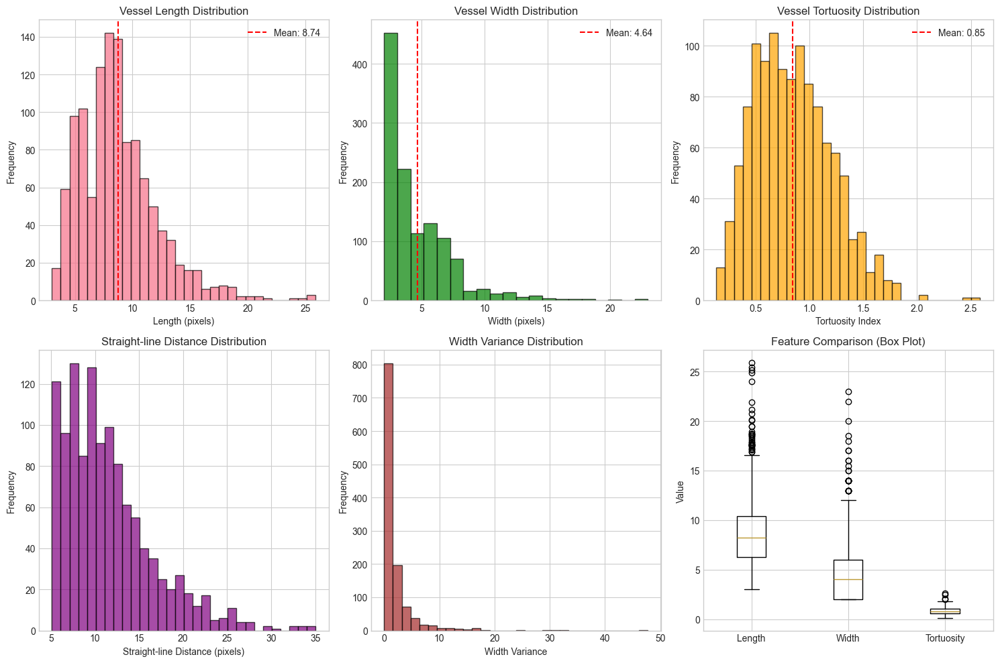


4. NODE DEGREE ANALYSIS (BRANCHING PATTERNS)


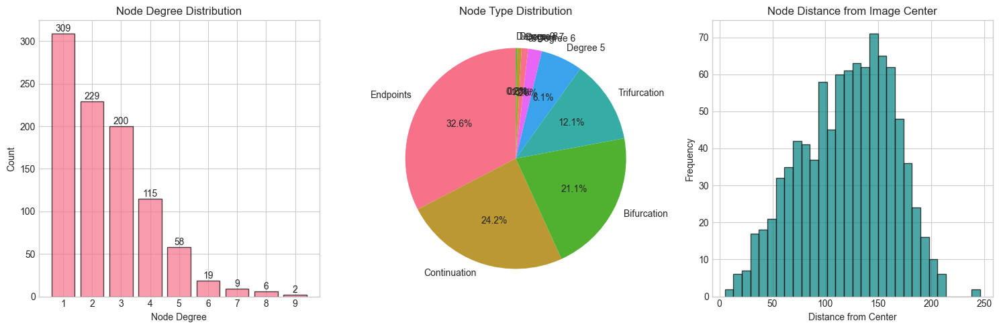


=== Branching Statistics ===
Total nodes: 947
Endpoints (degree=1): 309 (32.6%)
Continuation points (degree=2): 229 (24.2%)
Bifurcations (degree=3): 200 (21.1%)
Higher-order junctions (degree>=4): 209 (22.1%)

5. FEATURE CORRELATIONS


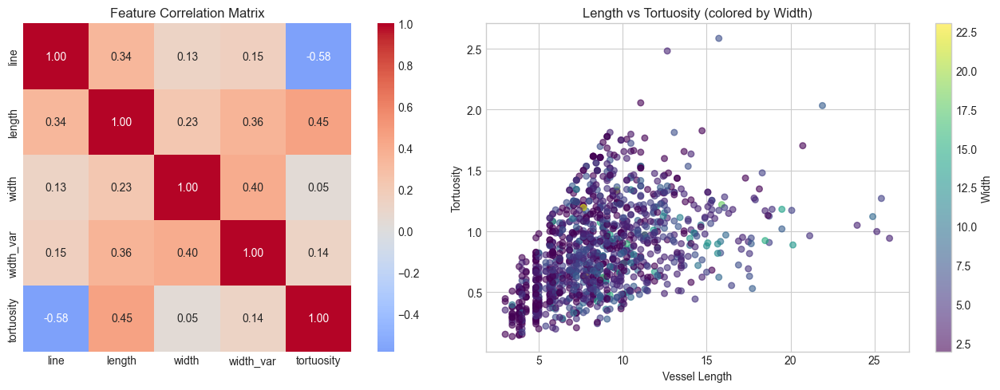


=== Correlation Insights ===
Length-Tortuosity correlation: 0.452
Width-Width_var correlation: 0.399
Line-Length correlation: 0.335

6. TORTUOSITY ANALYSIS


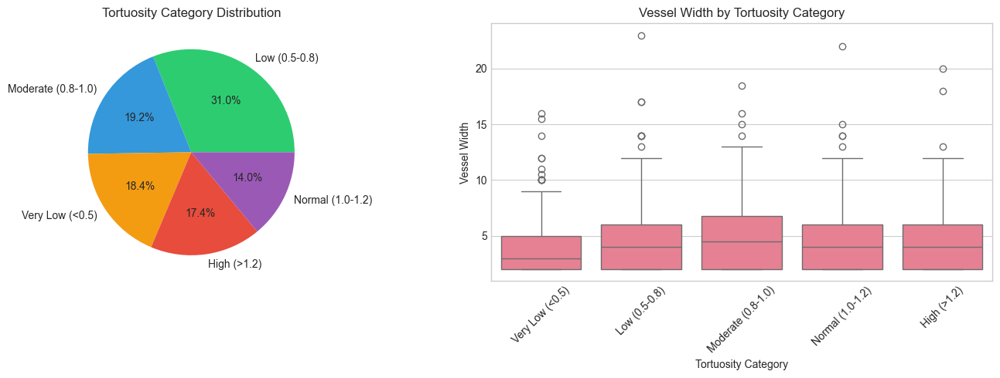


=== Tortuosity Category Counts ===
tortuosity_category
Low (0.5-0.8)         366
Moderate (0.8-1.0)    227
Very Low (<0.5)       217
High (>1.2)           205
Normal (1.0-1.2)      165
Name: count, dtype: int64

7. OUTLIER DETECTION


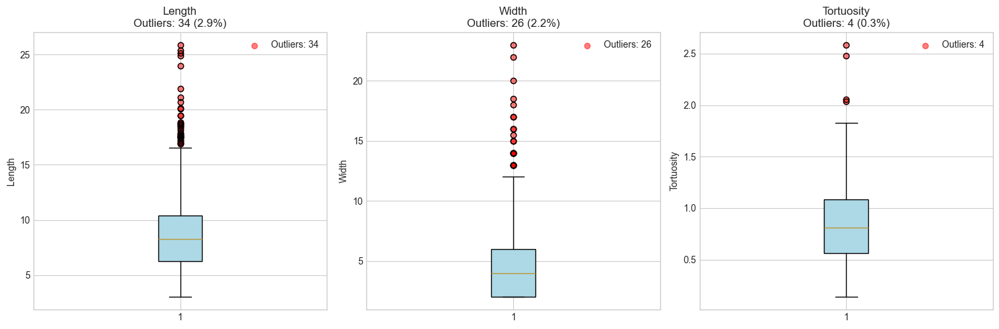


=== Outlier Summary ===
length: 34 outliers (2.9%) - Range: [-0.01, 16.67]
width: 26 outliers (2.2%) - Range: [-4.00, 12.00]
tortuosity: 4 outliers (0.3%) - Range: [-0.21, 1.86]
width_var: 95 outliers (8.1%) - Range: [-2.81, 5.19]

8. FINAL SUMMARY
SUMMARY: p3-from 5-5-2 M_patch_4

--- Dataset Overview ---
Total vessel segments: 1180
Total network nodes: 947

--- Vessel Morphology ---
Average vessel length: 8.74 ± 3.38 pixels
Average vessel width: 4.64 ± 2.88 pixels
Average tortuosity: 0.846 ± 0.362

--- Network Structure ---
Average node degree: 2.49
Bifurcation ratio: 21.1%
Endpoint ratio: 32.6%

--- Key Findings ---
1. Vessel length range: 3.0 - 25.9 pixels
2. Width range: 2.0 - 23.0 pixels
3. Most common tortuosity category: Low (0.5-0.8)
4. Length-Tortuosity correlation: 0.452

EDA COMPLETE FOR: p3-from 5-5-2 M_patch_4


In [36]:
run_full_eda(available_files[13])

EDA FOR: p4-from 5-5-2 M_patch_4

1. NETWORK VISUALIZATION


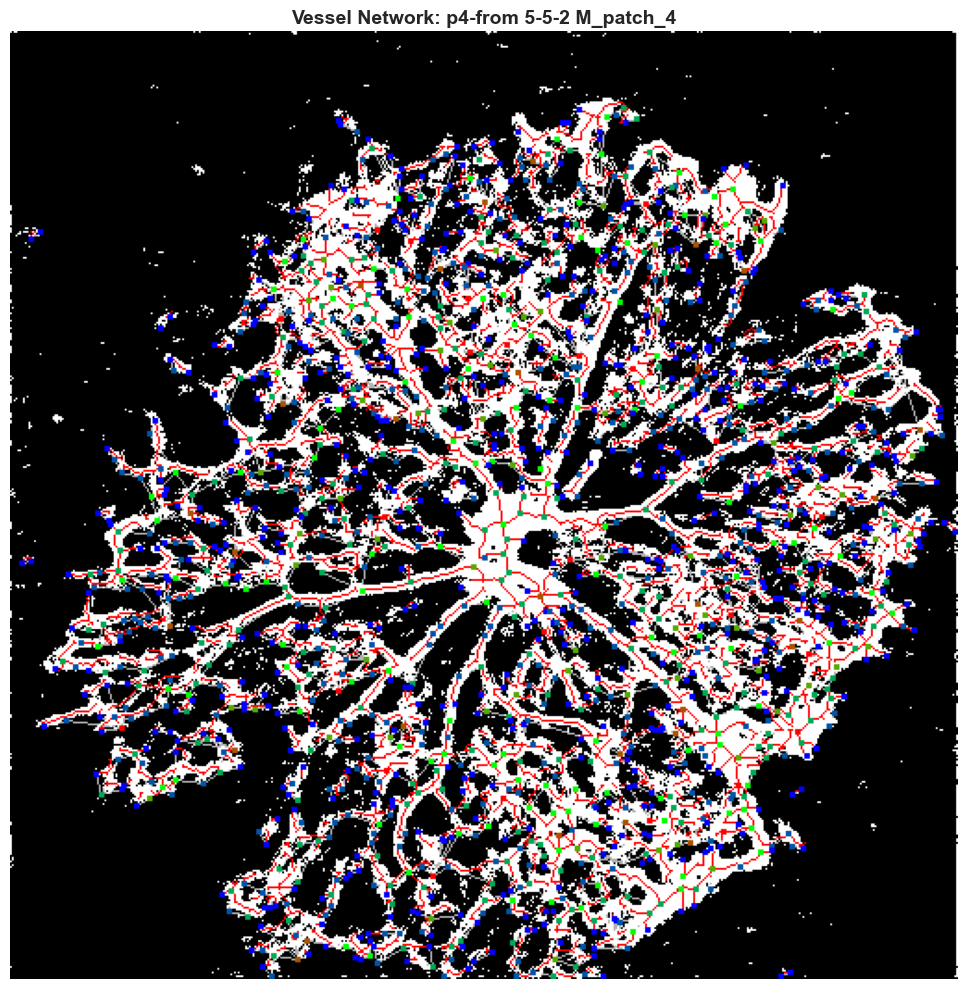


2. STATISTICAL SUMMARY
STATISTICAL SUMMARY

Total vessel segments: 1736
Total network nodes: 1530

--- Vessel Segment Statistics ---


,line,length,width,width_var,tortuosity
count,1736.000000,1736.000000,1736.000000,1736.000000,1736.000000
mean,11.748170,8.475592,3.963134,1.404786,0.817605
std,5.593747,3.812630,2.587449,2.754061,0.385211
min,5.099020,3.000000,2.000000,0.000000,0.127451
25%,7.810250,5.828428,2.000000,0.000000,0.525254
50%,10.440307,7.828428,3.000000,0.666667,0.763441
75%,14.422205,10.071070,5.000000,1.488281,1.060761
max,48.301139,41.142140,22.000000,30.800000,2.907107



--- Network Node Statistics ---


,distance,degree
count,1530.000000,1530.000000
mean,157.250533,2.269281
std,53.857963,1.544427
min,6.324555,1.000000
25%,121.078466,1.000000
50%,162.737469,2.000000
75%,199.721681,3.000000
max,295.935804,14.000000



3. VESSEL MORPHOLOGY DISTRIBUTIONS


/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/1856382823.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1, 2].boxplot([segments_df['length'], segments_df['width'], segments_df['tortuosity']],


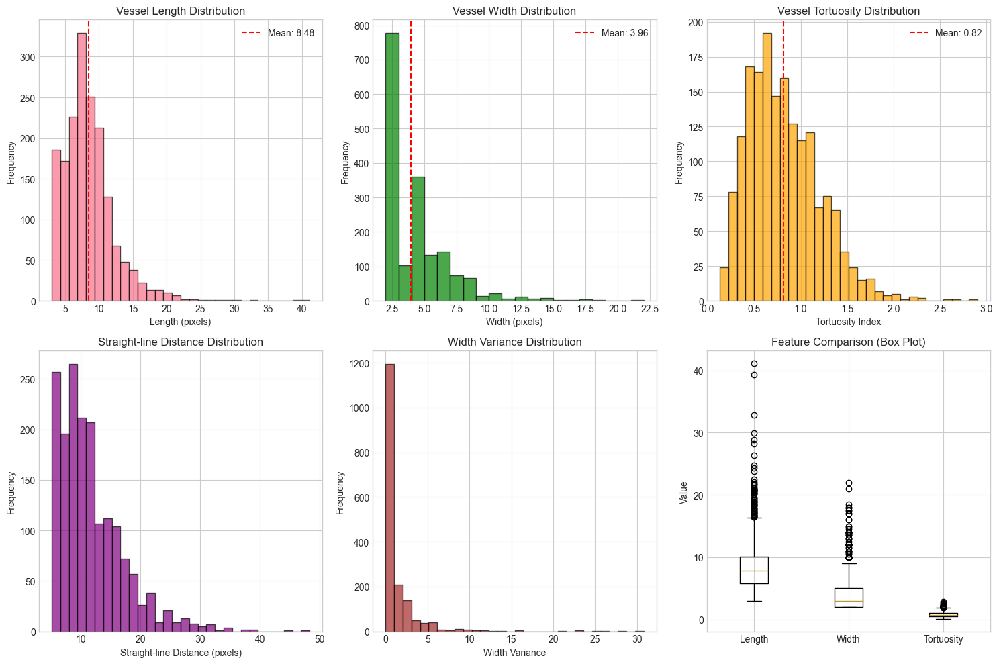


4. NODE DEGREE ANALYSIS (BRANCHING PATTERNS)


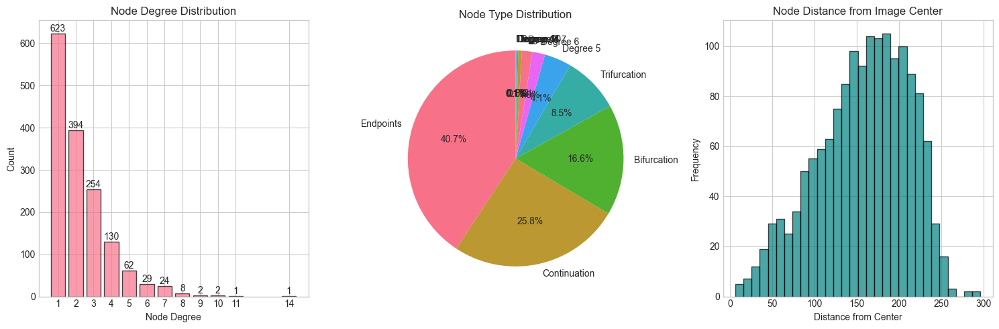


=== Branching Statistics ===
Total nodes: 1530
Endpoints (degree=1): 623 (40.7%)
Continuation points (degree=2): 394 (25.8%)
Bifurcations (degree=3): 254 (16.6%)
Higher-order junctions (degree>=4): 259 (16.9%)

5. FEATURE CORRELATIONS


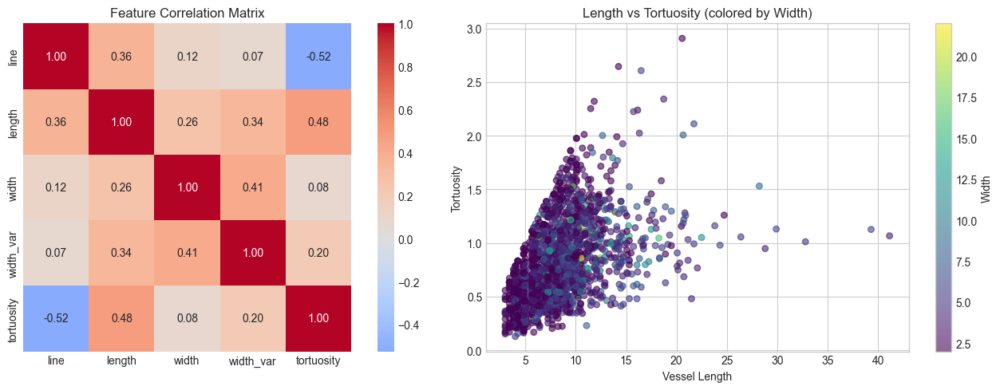


=== Correlation Insights ===
Length-Tortuosity correlation: 0.478
Width-Width_var correlation: 0.408
Line-Length correlation: 0.365

6. TORTUOSITY ANALYSIS


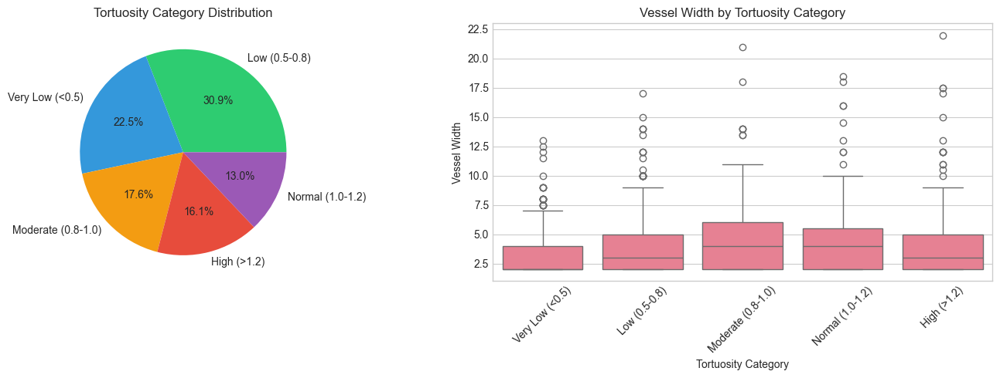


=== Tortuosity Category Counts ===
tortuosity_category
Low (0.5-0.8)         536
Very Low (<0.5)       390
Moderate (0.8-1.0)    306
High (>1.2)           279
Normal (1.0-1.2)      225
Name: count, dtype: int64

7. OUTLIER DETECTION


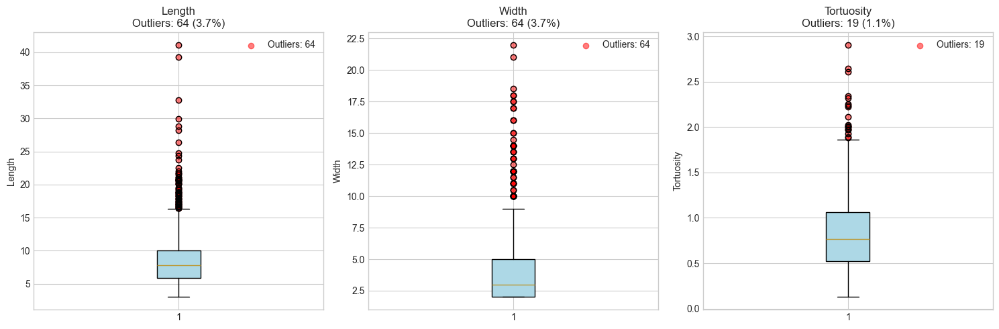


=== Outlier Summary ===
length: 64 outliers (3.7%) - Range: [-0.54, 16.44]
width: 64 outliers (3.7%) - Range: [-2.50, 9.50]
tortuosity: 19 outliers (1.1%) - Range: [-0.28, 1.86]
width_var: 153 outliers (8.8%) - Range: [-2.23, 3.72]

8. FINAL SUMMARY
SUMMARY: p4-from 5-5-2 M_patch_4

--- Dataset Overview ---
Total vessel segments: 1736
Total network nodes: 1530

--- Vessel Morphology ---
Average vessel length: 8.48 ± 3.81 pixels
Average vessel width: 3.96 ± 2.59 pixels
Average tortuosity: 0.818 ± 0.385

--- Network Structure ---
Average node degree: 2.27
Bifurcation ratio: 16.6%
Endpoint ratio: 40.7%

--- Key Findings ---
1. Vessel length range: 3.0 - 41.1 pixels
2. Width range: 2.0 - 22.0 pixels
3. Most common tortuosity category: Low (0.5-0.8)
4. Length-Tortuosity correlation: 0.478

EDA COMPLETE FOR: p4-from 5-5-2 M_patch_4


In [37]:
run_full_eda(available_files[22])

EDA FOR: p5-from 5-5-1 M_patch_4

1. NETWORK VISUALIZATION


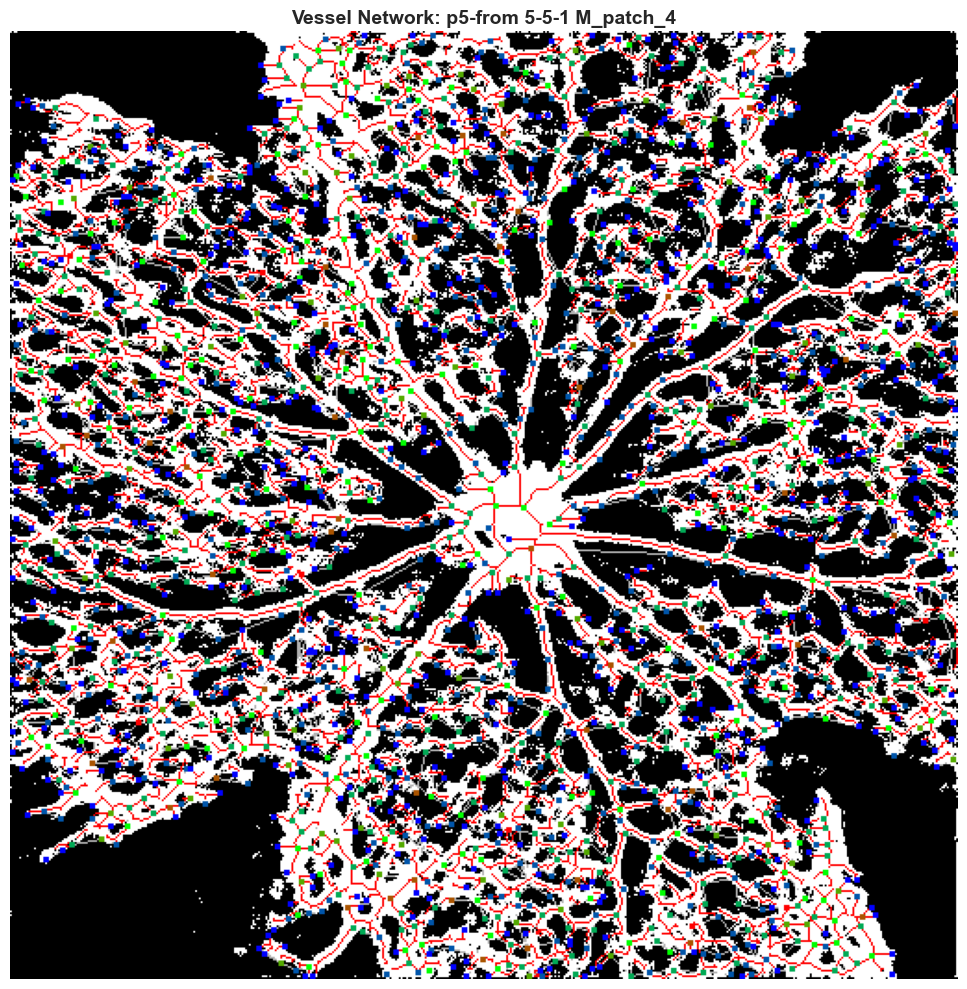


2. STATISTICAL SUMMARY
STATISTICAL SUMMARY

Total vessel segments: 2638
Total network nodes: 2132

--- Vessel Segment Statistics ---


,line,length,width,width_var,tortuosity
count,2638.000000,2638.000000,2638.000000,2638.000000,2638.000000
mean,11.685215,9.039774,4.392343,1.616797,0.857883
std,5.364713,4.157108,2.829830,3.853240,0.368977
min,5.099020,3.000000,2.000000,0.000000,0.143150
25%,7.810250,6.414214,2.000000,0.000000,0.575557
50%,10.440307,8.485284,4.000000,0.750000,0.810012
75%,14.317821,10.656856,6.000000,1.687500,1.109401
max,75.059976,73.899498,36.000000,73.270321,3.302725



--- Network Node Statistics ---


,distance,degree
count,2132.000000,2132.000000
mean,190.070726,2.474672
std,64.306223,1.478714
min,7.000000,1.000000
25%,145.353878,1.000000
50%,196.434464,2.000000
75%,240.831853,3.000000
max,335.931541,12.000000



3. VESSEL MORPHOLOGY DISTRIBUTIONS


/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/1856382823.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1, 2].boxplot([segments_df['length'], segments_df['width'], segments_df['tortuosity']],


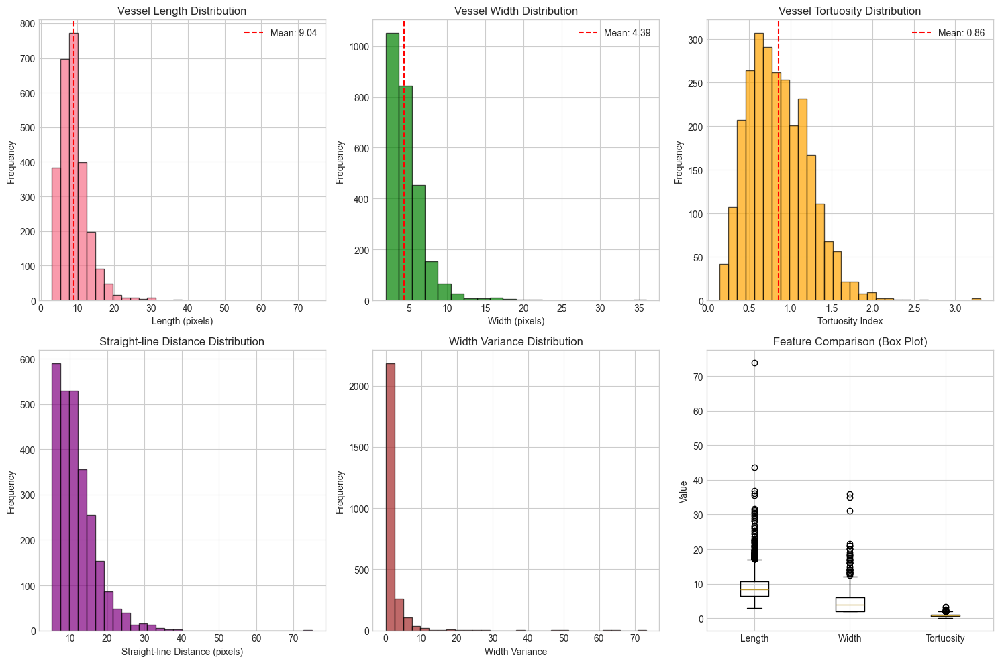


4. NODE DEGREE ANALYSIS (BRANCHING PATTERNS)


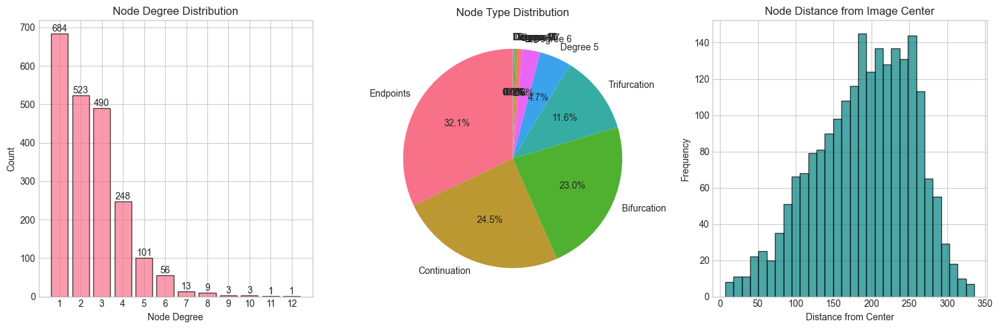


=== Branching Statistics ===
Total nodes: 2132
Endpoints (degree=1): 684 (32.1%)
Continuation points (degree=2): 523 (24.5%)
Bifurcations (degree=3): 490 (23.0%)
Higher-order junctions (degree>=4): 435 (20.4%)

5. FEATURE CORRELATIONS


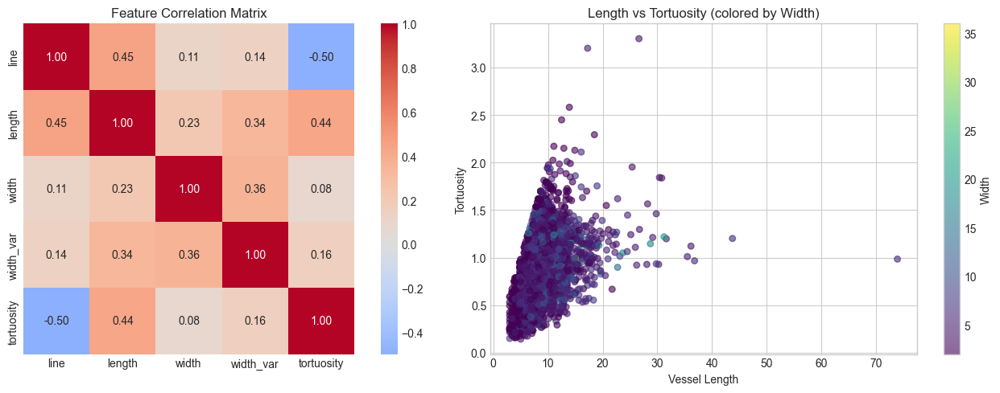


=== Correlation Insights ===
Length-Tortuosity correlation: 0.438
Width-Width_var correlation: 0.363
Line-Length correlation: 0.450

6. TORTUOSITY ANALYSIS


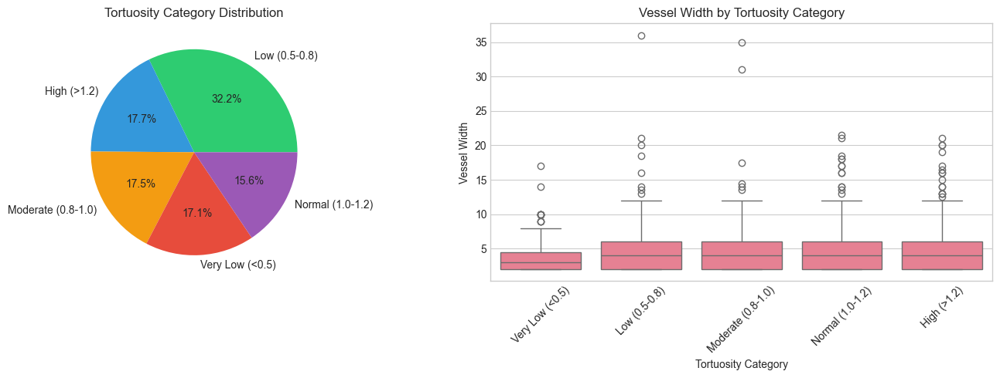


=== Tortuosity Category Counts ===
tortuosity_category
Low (0.5-0.8)         849
High (>1.2)           467
Moderate (0.8-1.0)    461
Very Low (<0.5)       450
Normal (1.0-1.2)      411
Name: count, dtype: int64

7. OUTLIER DETECTION


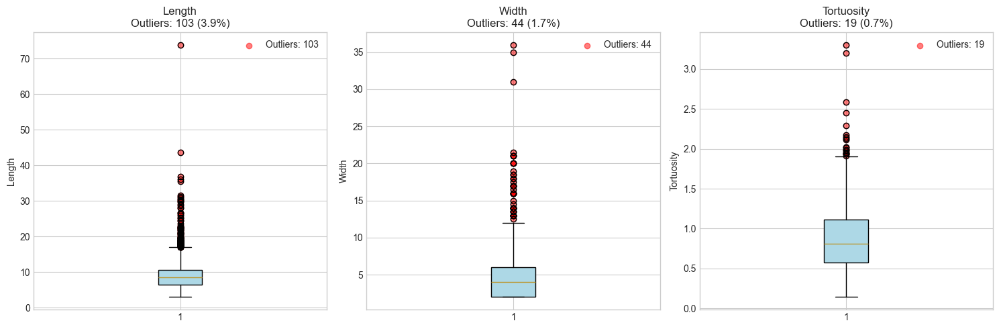


=== Outlier Summary ===
length: 103 outliers (3.9%) - Range: [0.05, 17.02]
width: 44 outliers (1.7%) - Range: [-4.00, 12.00]
tortuosity: 19 outliers (0.7%) - Range: [-0.23, 1.91]
width_var: 228 outliers (8.6%) - Range: [-2.53, 4.22]

8. FINAL SUMMARY
SUMMARY: p5-from 5-5-1 M_patch_4

--- Dataset Overview ---
Total vessel segments: 2638
Total network nodes: 2132

--- Vessel Morphology ---
Average vessel length: 9.04 ± 4.16 pixels
Average vessel width: 4.39 ± 2.83 pixels
Average tortuosity: 0.858 ± 0.369

--- Network Structure ---
Average node degree: 2.47
Bifurcation ratio: 23.0%
Endpoint ratio: 32.1%

--- Key Findings ---
1. Vessel length range: 3.0 - 73.9 pixels
2. Width range: 2.0 - 36.0 pixels
3. Most common tortuosity category: Low (0.5-0.8)
4. Length-Tortuosity correlation: 0.438

EDA COMPLETE FOR: p5-from 5-5-1 M_patch_4


In [38]:
run_full_eda(available_files[31])

EDA FOR: p6-from 5-5-2 M_patch_4

1. NETWORK VISUALIZATION


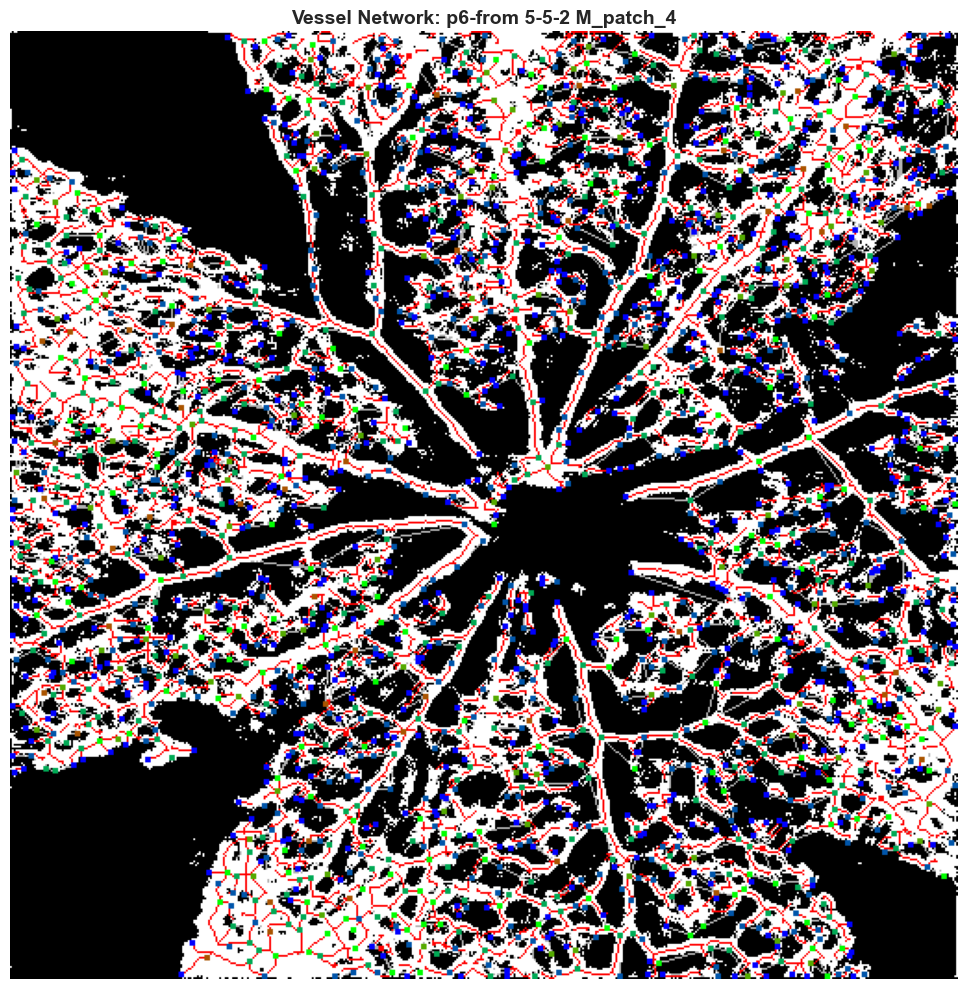


2. STATISTICAL SUMMARY
STATISTICAL SUMMARY

Total vessel segments: 2425
Total network nodes: 2009

--- Vessel Segment Statistics ---


,line,length,width,width_var,tortuosity
count,2425.000000,2425.000000,2425.000000,2425.000000,2425.000000
mean,11.960787,8.893364,4.126804,1.352184,0.836392
std,5.839594,4.379253,2.411876,2.461572,0.373794
min,5.099020,3.000000,2.000000,0.000000,0.114291
25%,7.615773,6.000000,2.000000,0.000000,0.542859
50%,10.630146,8.242642,4.000000,0.750000,0.789502
75%,14.560220,10.414214,5.000000,1.555556,1.095032
max,63.245553,49.183778,20.000000,42.854167,2.759564



--- Network Node Statistics ---


,distance,degree
count,2009.000000,2009.000000
mean,193.016635,2.414136
std,64.191410,1.550838
min,6.324555,1.000000
25%,147.732867,1.000000
50%,200.743618,2.000000
75%,241.132744,3.000000
max,357.095225,15.000000



3. VESSEL MORPHOLOGY DISTRIBUTIONS


/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/1856382823.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1, 2].boxplot([segments_df['length'], segments_df['width'], segments_df['tortuosity']],


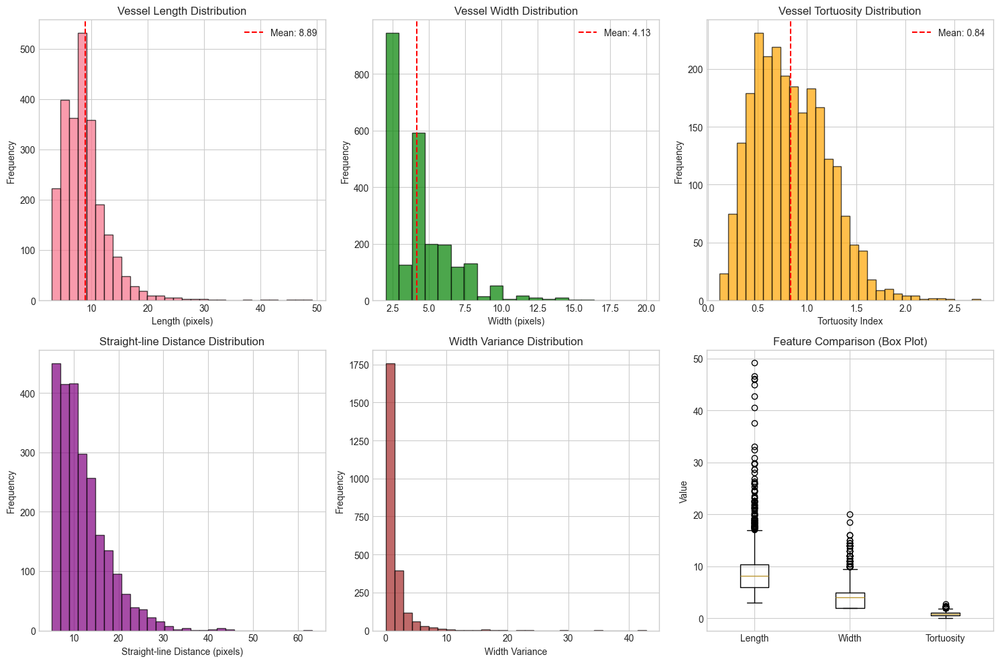


4. NODE DEGREE ANALYSIS (BRANCHING PATTERNS)


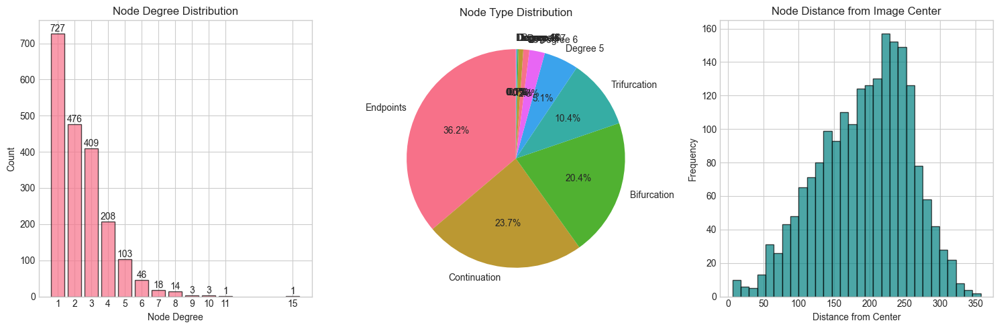


=== Branching Statistics ===
Total nodes: 2009
Endpoints (degree=1): 727 (36.2%)
Continuation points (degree=2): 476 (23.7%)
Bifurcations (degree=3): 409 (20.4%)
Higher-order junctions (degree>=4): 397 (19.8%)

5. FEATURE CORRELATIONS


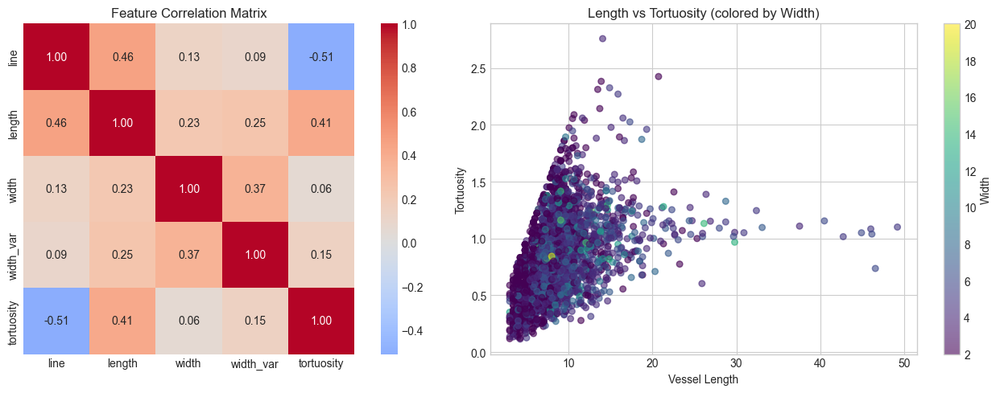


=== Correlation Insights ===
Length-Tortuosity correlation: 0.413
Width-Width_var correlation: 0.366
Line-Length correlation: 0.456

6. TORTUOSITY ANALYSIS


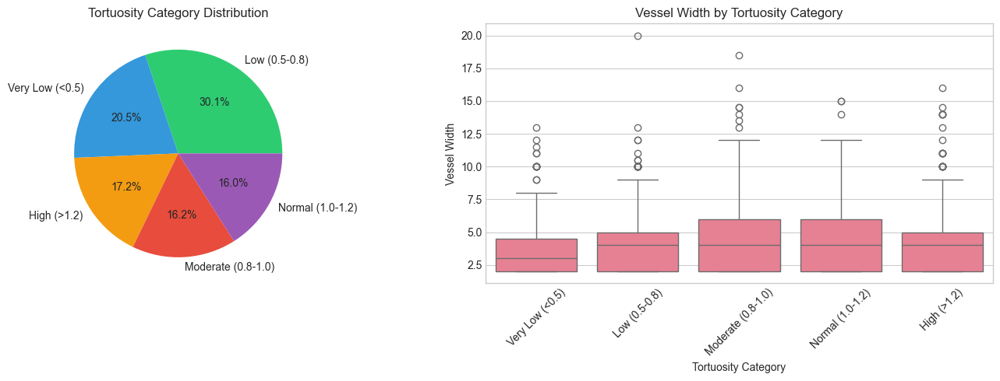


=== Tortuosity Category Counts ===
tortuosity_category
Low (0.5-0.8)         731
Very Low (<0.5)       498
High (>1.2)           416
Moderate (0.8-1.0)    392
Normal (1.0-1.2)      388
Name: count, dtype: int64

7. OUTLIER DETECTION


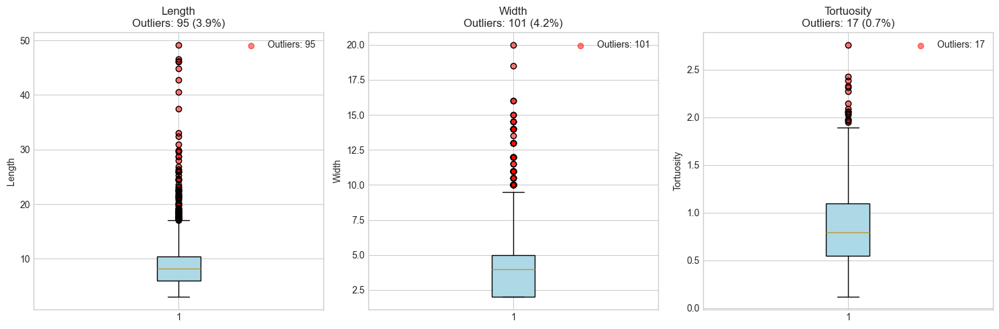


=== Outlier Summary ===
length: 95 outliers (3.9%) - Range: [-0.62, 17.04]
width: 101 outliers (4.2%) - Range: [-2.50, 9.50]
tortuosity: 17 outliers (0.7%) - Range: [-0.29, 1.92]
width_var: 183 outliers (7.5%) - Range: [-2.33, 3.89]

8. FINAL SUMMARY
SUMMARY: p6-from 5-5-2 M_patch_4

--- Dataset Overview ---
Total vessel segments: 2425
Total network nodes: 2009

--- Vessel Morphology ---
Average vessel length: 8.89 ± 4.38 pixels
Average vessel width: 4.13 ± 2.41 pixels
Average tortuosity: 0.836 ± 0.374

--- Network Structure ---
Average node degree: 2.41
Bifurcation ratio: 20.4%
Endpoint ratio: 36.2%

--- Key Findings ---
1. Vessel length range: 3.0 - 49.2 pixels
2. Width range: 2.0 - 20.0 pixels
3. Most common tortuosity category: Low (0.5-0.8)
4. Length-Tortuosity correlation: 0.413

EDA COMPLETE FOR: p6-from 5-5-2 M_patch_4


In [39]:
run_full_eda(available_files[40])

EDA FOR: p7-from 5-5-2 M_patch_4

1. NETWORK VISUALIZATION


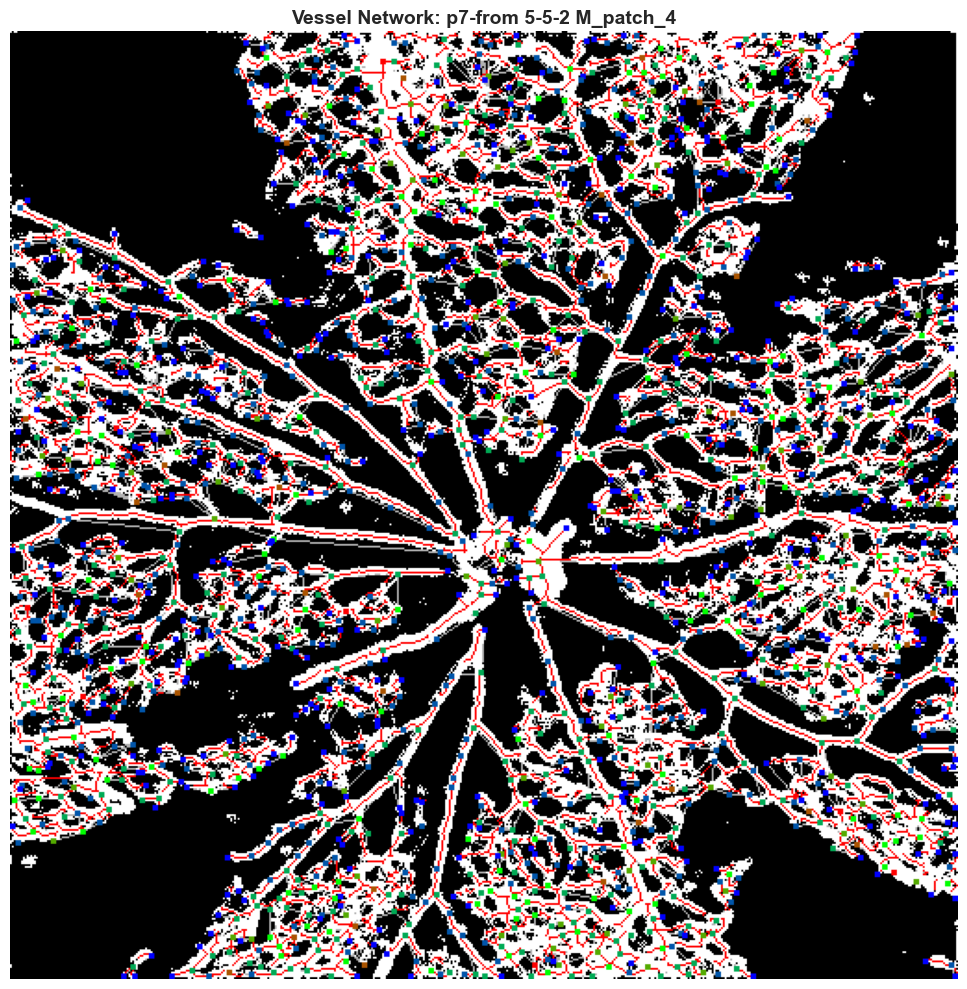


2. STATISTICAL SUMMARY
STATISTICAL SUMMARY

Total vessel segments: 2233
Total network nodes: 1789

--- Vessel Segment Statistics ---


,line,length,width,width_var,tortuosity
count,2233.000000,2233.000000,2233.000000,2233.000000,2233.000000
mean,11.914807,8.991077,3.769816,0.927376,0.838743
std,6.158832,5.239104,1.884333,1.304565,0.365775
min,5.099020,3.000000,2.000000,0.000000,0.127971
25%,7.615773,6.000000,2.000000,0.000000,0.565686
50%,10.440307,8.071070,4.000000,0.640000,0.805936
75%,14.317821,10.414214,5.000000,1.047500,1.091982
max,90.271812,90.870066,20.000000,16.775510,2.263197



--- Network Node Statistics ---


,distance,degree
count,1789.000000,1789.000000
mean,191.447329,2.496367
std,63.255751,1.413665
min,4.000000,1.000000
25%,148.932871,1.000000
50%,199.912481,2.000000
75%,239.985416,3.000000
max,359.918046,10.000000



3. VESSEL MORPHOLOGY DISTRIBUTIONS


/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/1856382823.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1, 2].boxplot([segments_df['length'], segments_df['width'], segments_df['tortuosity']],


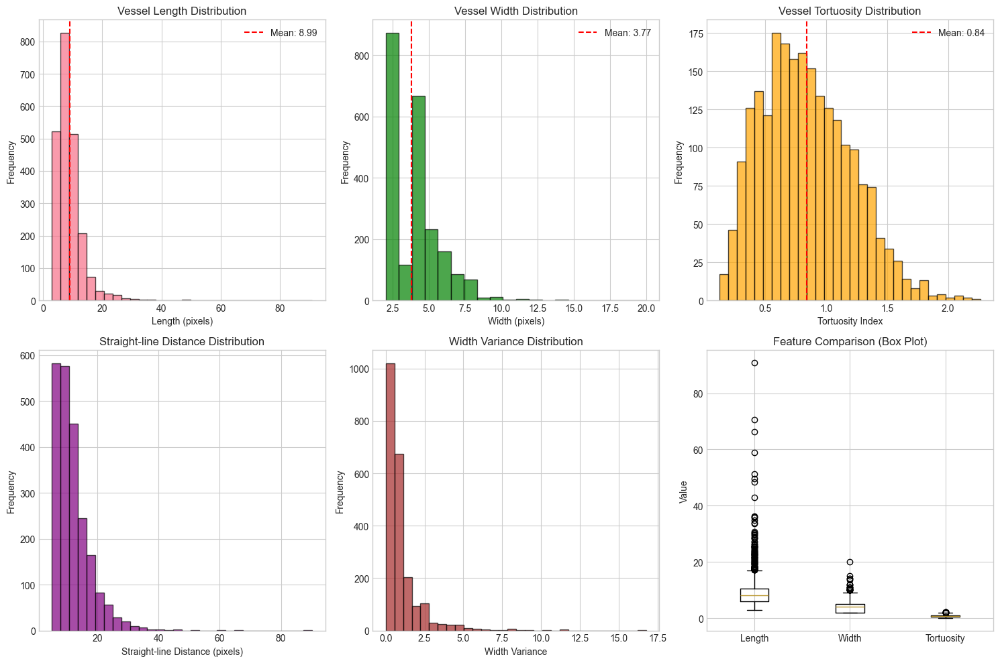


4. NODE DEGREE ANALYSIS (BRANCHING PATTERNS)


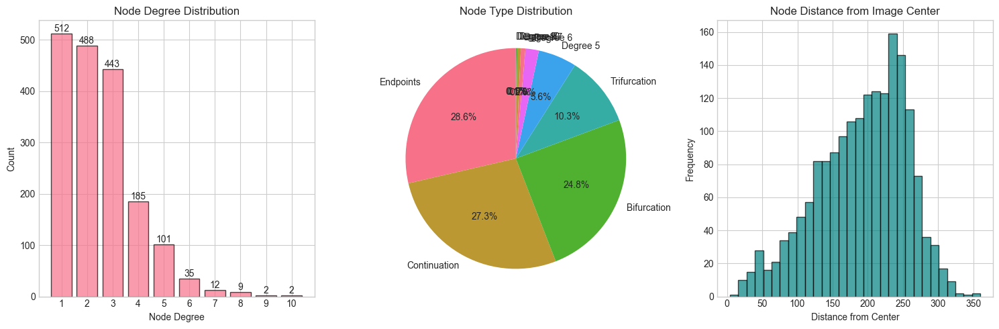


=== Branching Statistics ===
Total nodes: 1789
Endpoints (degree=1): 512 (28.6%)
Continuation points (degree=2): 488 (27.3%)
Bifurcations (degree=3): 443 (24.8%)
Higher-order junctions (degree>=4): 346 (19.3%)

5. FEATURE CORRELATIONS


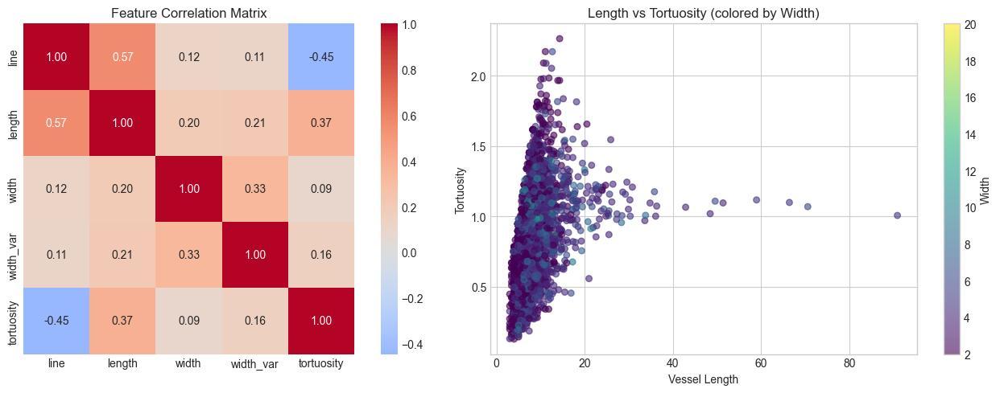


=== Correlation Insights ===
Length-Tortuosity correlation: 0.374
Width-Width_var correlation: 0.332
Line-Length correlation: 0.569

6. TORTUOSITY ANALYSIS


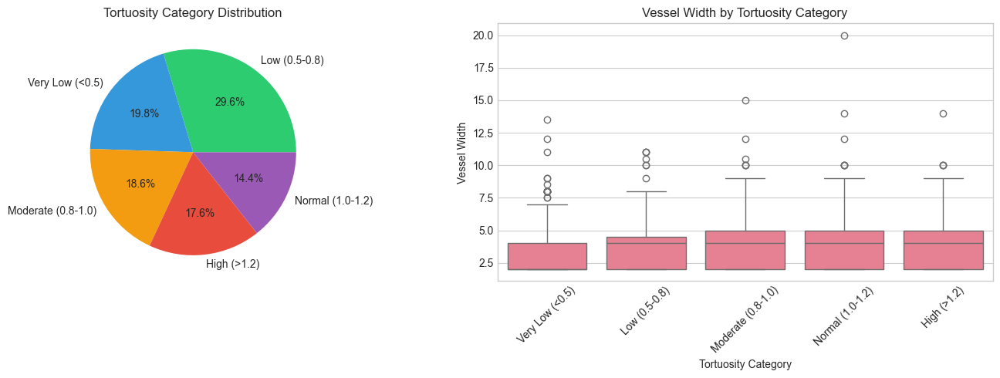


=== Tortuosity Category Counts ===
tortuosity_category
Low (0.5-0.8)         662
Very Low (<0.5)       443
Moderate (0.8-1.0)    415
High (>1.2)           392
Normal (1.0-1.2)      321
Name: count, dtype: int64

7. OUTLIER DETECTION


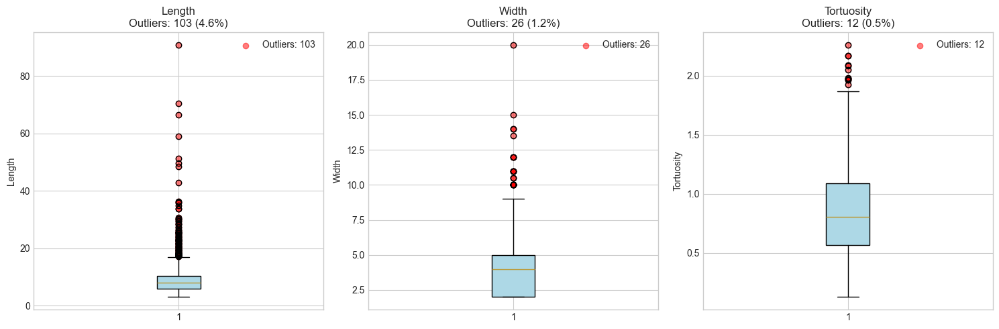


=== Outlier Summary ===
length: 103 outliers (4.6%) - Range: [-0.62, 17.04]
width: 26 outliers (1.2%) - Range: [-2.50, 9.50]
tortuosity: 12 outliers (0.5%) - Range: [-0.22, 1.88]
width_var: 166 outliers (7.4%) - Range: [-1.57, 2.62]

8. FINAL SUMMARY
SUMMARY: p7-from 5-5-2 M_patch_4

--- Dataset Overview ---
Total vessel segments: 2233
Total network nodes: 1789

--- Vessel Morphology ---
Average vessel length: 8.99 ± 5.24 pixels
Average vessel width: 3.77 ± 1.88 pixels
Average tortuosity: 0.839 ± 0.366

--- Network Structure ---
Average node degree: 2.50
Bifurcation ratio: 24.8%
Endpoint ratio: 28.6%

--- Key Findings ---
1. Vessel length range: 3.0 - 90.9 pixels
2. Width range: 2.0 - 20.0 pixels
3. Most common tortuosity category: Low (0.5-0.8)
4. Length-Tortuosity correlation: 0.374

EDA COMPLETE FOR: p7-from 5-5-2 M_patch_4


In [40]:
run_full_eda(available_files[49])

EDA FOR: p7-x 001 M_patch_4

1. NETWORK VISUALIZATION


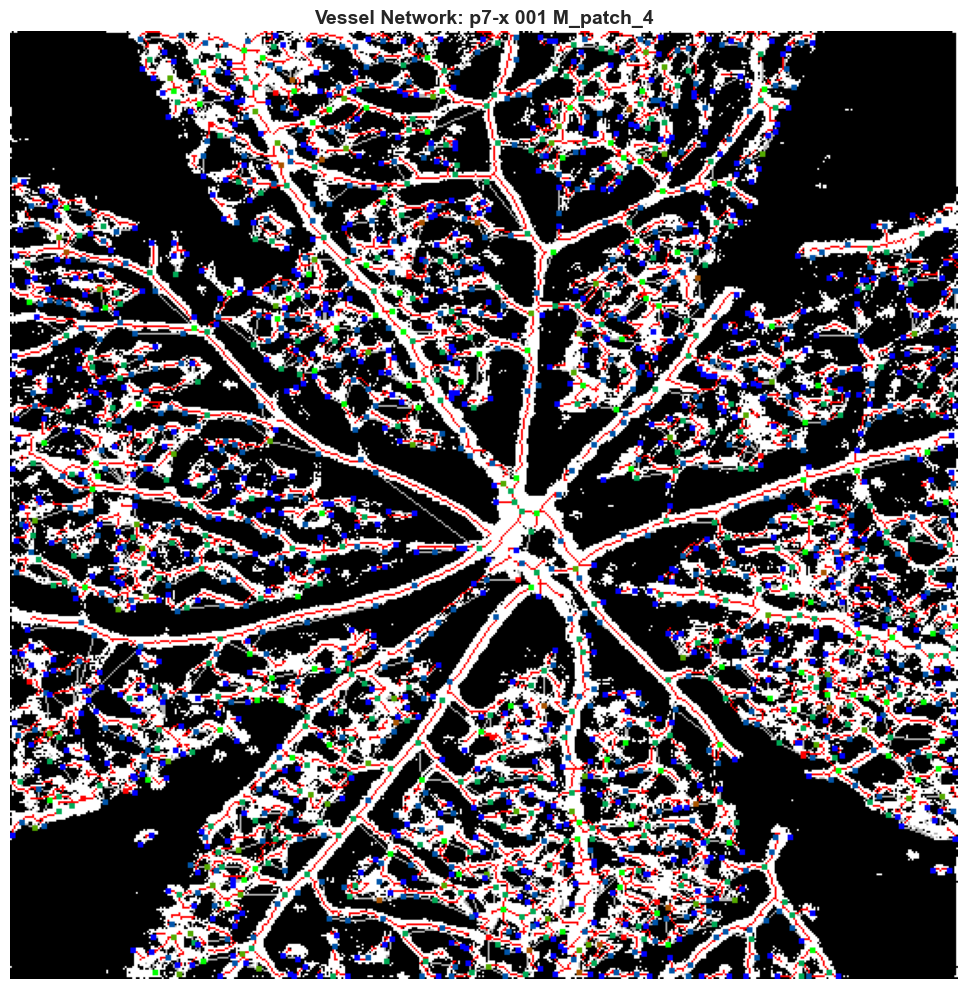


2. STATISTICAL SUMMARY
STATISTICAL SUMMARY

Total vessel segments: 2070
Total network nodes: 1916

--- Vessel Segment Statistics ---


,line,length,width,width_var,tortuosity
count,2070.000000,2070.000000,2070.000000,2070.000000,2070.000000
mean,11.791889,8.758900,3.359420,0.749206,0.826143
std,6.189816,5.014702,1.844694,1.301031,0.379954
min,5.099020,3.000000,2.000000,0.000000,0.121218
25%,7.615773,5.656856,2.000000,0.000000,0.539835
50%,10.198039,7.828428,2.000000,0.443750,0.777232
75%,14.115519,10.414214,4.000000,0.960000,1.077310
max,96.400207,76.911704,16.000000,20.690000,2.922032



--- Network Node Statistics ---


,distance,degree
count,1916.000000,1916.000000
mean,191.773612,2.160752
std,61.906919,1.403927
min,7.280110,1.000000
25%,147.838593,1.000000
50%,200.158682,2.000000
75%,241.457018,3.000000
max,319.864034,12.000000



3. VESSEL MORPHOLOGY DISTRIBUTIONS


/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/1856382823.py:50: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[1, 2].boxplot([segments_df['length'], segments_df['width'], segments_df['tortuosity']],


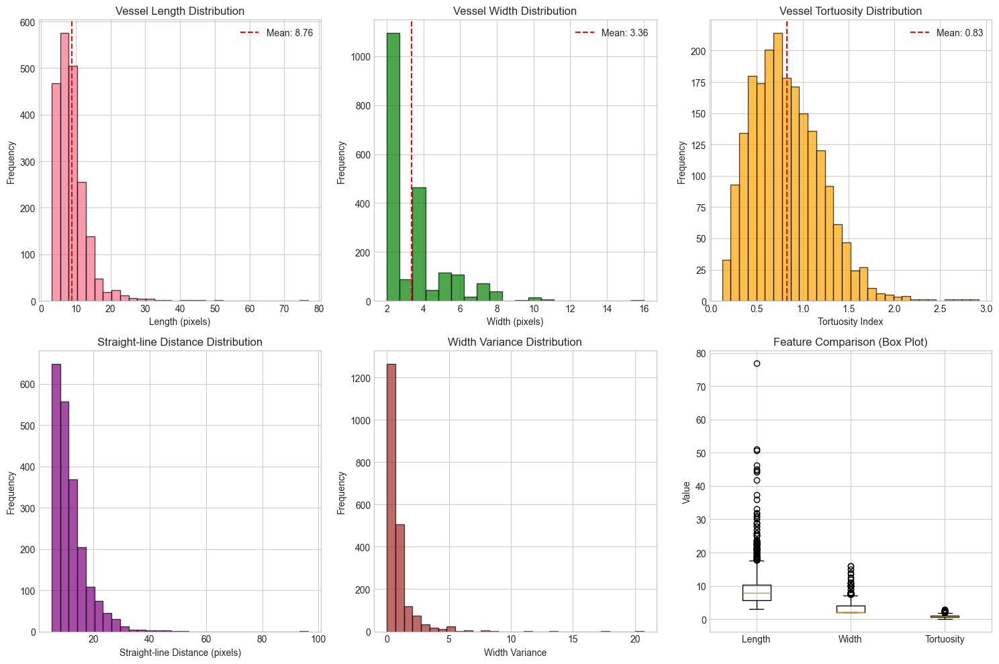


4. NODE DEGREE ANALYSIS (BRANCHING PATTERNS)


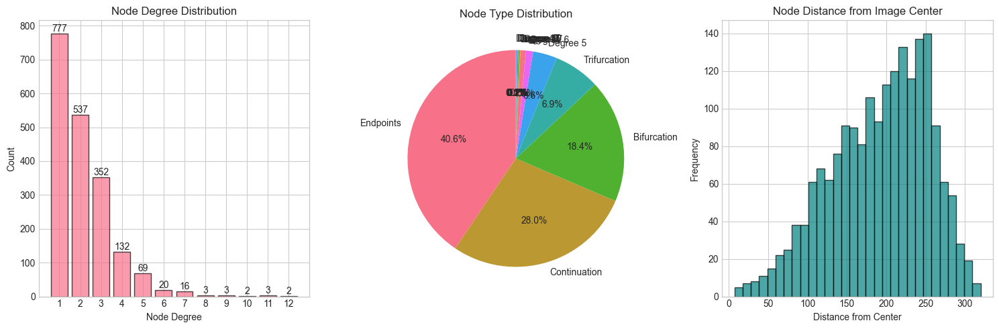


=== Branching Statistics ===
Total nodes: 1916
Endpoints (degree=1): 777 (40.6%)
Continuation points (degree=2): 537 (28.0%)
Bifurcations (degree=3): 352 (18.4%)
Higher-order junctions (degree>=4): 250 (13.0%)

5. FEATURE CORRELATIONS


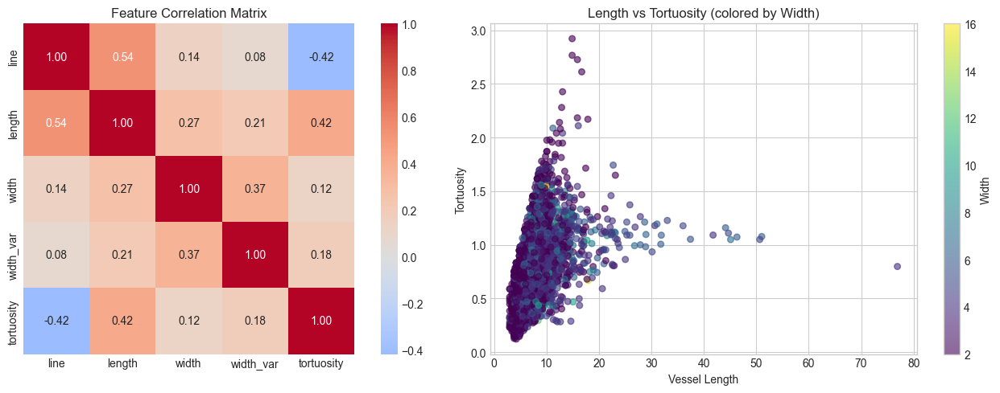


=== Correlation Insights ===
Length-Tortuosity correlation: 0.422
Width-Width_var correlation: 0.367
Line-Length correlation: 0.537

6. TORTUOSITY ANALYSIS


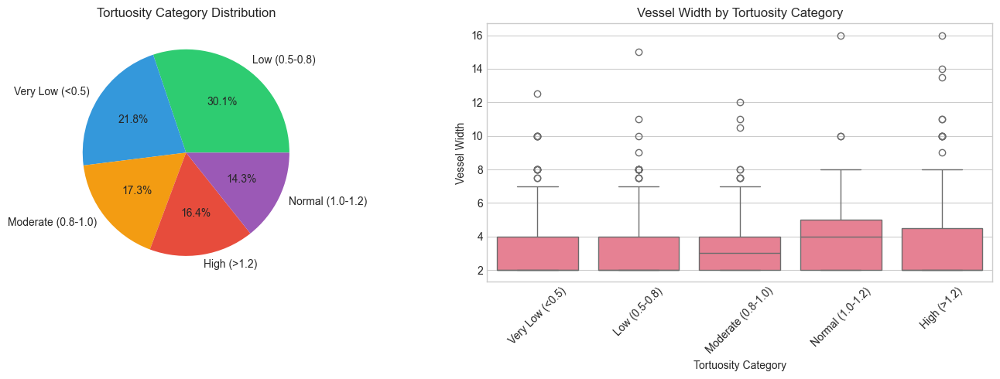


=== Tortuosity Category Counts ===
tortuosity_category
Low (0.5-0.8)         624
Very Low (<0.5)       452
Moderate (0.8-1.0)    359
High (>1.2)           339
Normal (1.0-1.2)      296
Name: count, dtype: int64

7. OUTLIER DETECTION


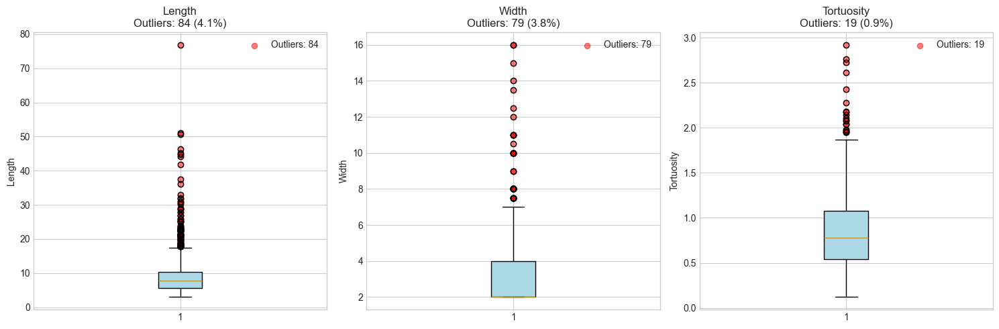


=== Outlier Summary ===
length: 84 outliers (4.1%) - Range: [-1.48, 17.55]
width: 79 outliers (3.8%) - Range: [-1.00, 7.00]
tortuosity: 19 outliers (0.9%) - Range: [-0.27, 1.88]
width_var: 149 outliers (7.2%) - Range: [-1.44, 2.40]

8. FINAL SUMMARY
SUMMARY: p7-x 001 M_patch_4

--- Dataset Overview ---
Total vessel segments: 2070
Total network nodes: 1916

--- Vessel Morphology ---
Average vessel length: 8.76 ± 5.01 pixels
Average vessel width: 3.36 ± 1.84 pixels
Average tortuosity: 0.826 ± 0.380

--- Network Structure ---
Average node degree: 2.16
Bifurcation ratio: 18.4%
Endpoint ratio: 40.6%

--- Key Findings ---
1. Vessel length range: 3.0 - 76.9 pixels
2. Width range: 2.0 - 16.0 pixels
3. Most common tortuosity category: Low (0.5-0.8)
4. Length-Tortuosity correlation: 0.422

EDA COMPLETE FOR: p7-x 001 M_patch_4


In [41]:
run_full_eda(available_files[58])

## Developmental Analysis (P2-P7)

Run the developmental analysis to compare vessel morphology and branching patterns across postnatal days P2-P7. This analysis is crucial for understanding angiogenesis and vascular remodeling during mouse retinal development.

DEVELOPMENTAL ANALYSIS: MOUSE RETINAL VASCULATURE (P2-P7)

Loading all data...
Total vessel segments loaded: 12917
Total network nodes loaded: 10868
Postnatal days: ['P2', 'P3', 'P4', 'P5', 'P6', 'P7']

1. SUMMARY STATISTICS BY POSTNATAL DAY


,Postnatal Day,Vessel Segments,Network Nodes,Mean Length,Mean Width,Mean Tortuosity,Bifurcation %,Endpoint %,Mean Distance
0,P2,635,545,8.61 ± 3.52,4.36 ± 3.14,0.823 ± 0.365,19.4%,39.4%,100.3
1,P3,1180,947,8.74 ± 3.38,4.64 ± 2.88,0.846 ± 0.362,21.1%,32.6%,120.2
2,P4,1736,1530,8.48 ± 3.81,3.96 ± 2.59,0.818 ± 0.385,16.6%,40.7%,157.3
3,P5,2638,2132,9.04 ± 4.16,4.39 ± 2.83,0.858 ± 0.369,23.0%,32.1%,190.1
4,P6,2425,2009,8.89 ± 4.38,4.13 ± 2.41,0.836 ± 0.374,20.4%,36.2%,193.0
5,P7,4303,3705,8.88 ± 5.13,3.57 ± 1.88,0.833 ± 0.373,21.5%,34.8%,191.6



2. VESSEL MORPHOLOGY DEVELOPMENT


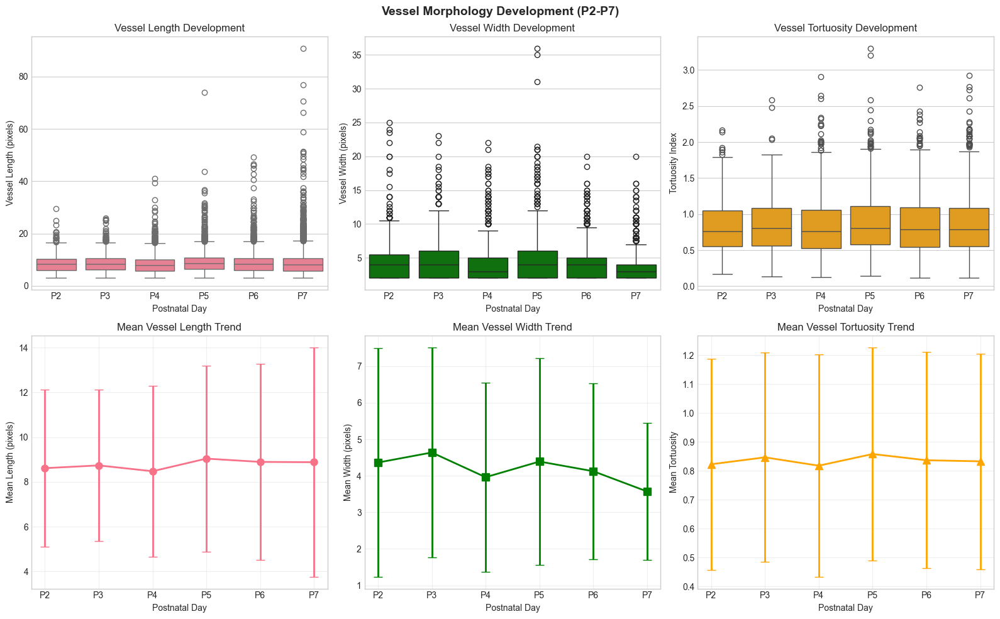


3. BRANCHING PATTERN DEVELOPMENT


/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/43234473.py:33: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  bifurc_ratio = nodes_df.groupby('postnatal_day').apply(
/var/folders/79/5nl71bhj1_54bg4tk34nwc940000gn/T/ipykernel_23116/43234473.py:43: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  endpoint_ratio = nodes_df.groupby('postnatal_day').apply(


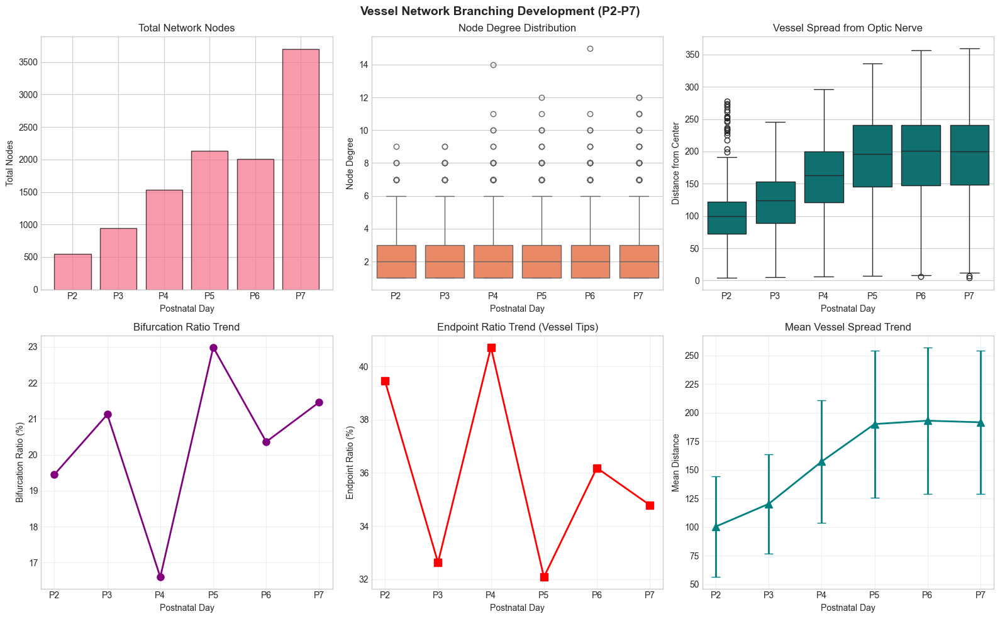


4. FEATURE DISTRIBUTION COMPARISON


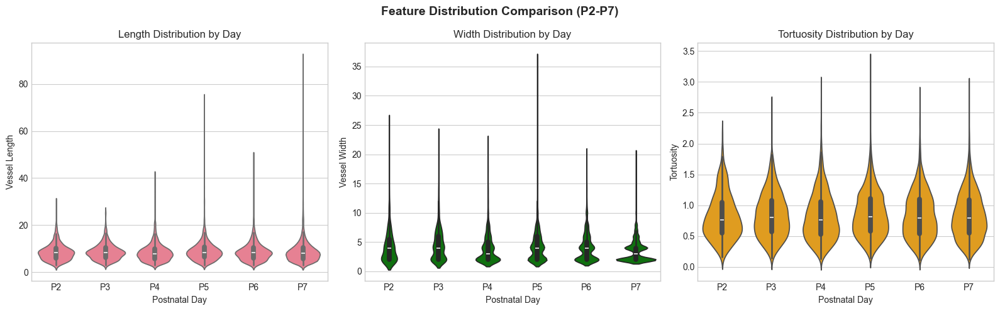


5. KEY DEVELOPMENTAL FINDINGS

--- Changes from P2 to P7 ---
Mean vessel length: +3.1%
Mean vessel width: -18.2%
Mean tortuosity: +1.2%
Mean distance from center: +91.0%
Bifurcation ratio: 19.4% → 21.5%

DEVELOPMENTAL ANALYSIS COMPLETE


In [35]:
# Run developmental analysis across all postnatal days (P2-P7)
# This will load all files and compare features across developmental stages

stages = []
for i in [4,13,22,31,40,49,58]:
    stages.append(available_files[i])
segments_combined, nodes_combined = run_developmental_analysis(stages)